#### Importing Libraries 

##### Step 1: Need to Run

In [1]:
import pandas as pd
import os
from openai import OpenAI
from tqdm.notebook import tqdm
import Imports
from time import sleep
from dotenv import load_dotenv
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

C:\Users\leste\AppData\Local\Temp\ipykernel_4596\2233592622.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


#### Generate xml file containing ticker_name and cid(company id) for fetching news details from economic times webpage

In [ ]:
import xml.etree.ElementTree as ET

# Define the data
data = [
    {"Ticker": "ADANIENT", "Ticker_Name": "adani-enterprises-ltd", "CID": 9074},
    {"Ticker": "ADANIPORTS", "Ticker_Name": "adani-ports-special-economic-zone-ltd", "CID": 20316},
    {"Ticker": "APOLLOHOSP", "Ticker_Name": "apollo-hospitals-enterprise-ltd", "CID": 62},
    {"Ticker": "ASIANPAINT", "Ticker_Name": "asian-paints-ltd", "CID": 14034},
    {"Ticker": "AXISBANK", "Ticker_Name": "axis-bank-ltd", "CID": 9175},
    {"Ticker": "BAJAJAUTO", "Ticker_Name": "bajaj-auto-ltd", "CID": 21430},
    {"Ticker": "BAJFINANCE", "Ticker_Name": "bajaj-finance-ltd", "CID": 11260},
    {"Ticker": "BAJAJFINSV", "Ticker_Name": "bajaj-finserv-ltd", "CID": 21426},
    {"Ticker": "BPCL", "Ticker_Name": "bharat-petroleum-corporation-ltd", "CID": 11941},
    {"Ticker": "BHARTIARTL", "Ticker_Name": "bharti-airtel-ltd", "CID": 2718},
    {"Ticker": "BRITANNIA", "Ticker_Name": "britannia-industries-ltd", "CID": 13934},
    {"Ticker": "CIPLA", "Ticker_Name": "cipla-ltd", "CID": 13917},
    {"Ticker": "COALINDIA", "Ticker_Name": "coal-india-ltd", "CID": 11822},
    {"Ticker": "DIVISLAB", "Ticker_Name": "divis-laboratories-ltd", "CID": 3635},
    {"Ticker": "DRREDDY", "Ticker_Name": "dr-reddys-laboratories-ltd", "CID": 13841},
    {"Ticker": "EICHERMOT", "Ticker_Name": "eicher-motors-ltd", "CID": 13787},
    {"Ticker": "GRASIM", "Ticker_Name": "grasim-industries-ltd", "CID": 13696},
    {"Ticker": "HCLTECH", "Ticker_Name": "hcl-technologies-ltd", "CID": 4291},
    {"Ticker": "HDFCBANK", "Ticker_Name": "hdfc-bank-ltd", "CID": 9195},
    {"Ticker": "HDFCLIFE", "Ticker_Name": "hdfc-life-insurance-company-ltd", "CID": 3068},
    {"Ticker": "HEROMOTOCO", "Ticker_Name": "hero-motocorp-ltd", "CID": 13636},
    {"Ticker": "HINDALCO", "Ticker_Name": "hindalco-industries-ltd", "CID": 13637},
    {"Ticker": "HINDUNILVR", "Ticker_Name": "hindustan-unilever-ltd", "CID": 13616},
    {"Ticker": "ICICIBANK", "Ticker_Name": "icici-bank-ltd", "CID": 9194},
    {"Ticker": "ITC", "Ticker_Name": "itc-ltd", "CID": 13554},
    {"Ticker": "INDUSINDBK", "Ticker_Name": "indusind-bank-ltd", "CID": 9196},
    {"Ticker": "INFY", "Ticker_Name": "infosys-ltd", "CID": 10960},
    {"Ticker": "JSWSTEEL", "Ticker_Name": "jsw-steel-ltd", "CID": 8352},
    {"Ticker": "KOTAKBANK", "Ticker_Name": "kotak-mahindra-bank-ltd", "CID": 12161},
    {"Ticker": "LT", "Ticker_Name": "larsen-toubro-ltd", "CID": 13447},
    {"Ticker": "LTIM", "Ticker_Name": "ltimindtree-ltd", "CID": 3318},
    {"Ticker": "M&M", "Ticker_Name": "mahindra-mahindra-ltd", "CID": 11898},
    {"Ticker": "MARUTI", "Ticker_Name": "maruti-suzuki-india-ltd", "CID": 11890},
    {"Ticker": "NESTLEIND", "Ticker_Name": "nestle-india-ltd", "CID": 13330},
    {"Ticker": "NTPC", "Ticker_Name": "ntpc-ltd", "CID": 12316},
    {"Ticker": "ONGC", "Ticker_Name": "oil-and-natural-gas-corporation-ltd", "CID": 11599},
    {"Ticker": "POWERGRID", "Ticker_Name": "power-grid-corporation-of-india-ltd", "CID": 4628},
    {"Ticker": "RELIANCE", "Ticker_Name": "reliance-industries-ltd", "CID": 13215},
    {"Ticker": "SBILIFE", "Ticker_Name": "sbi-life-insurance-company-ltd", "CID": 2898},
    {"Ticker": "SBIN", "Ticker_Name": "state-bank-of-india", "CID": 11984},
    {"Ticker": "SUNPHARMA", "Ticker_Name": "sun-pharmaceutical-industries-ltd", "CID": 9134},
    {"Ticker": "TCS", "Ticker_Name": "tata-consultancy-services-ltd", "CID": 8345},
    {"Ticker": "TATACONSUM", "Ticker_Name": "tata-consumer-products-ltd", "CID": 12929},
    {"Ticker": "TATAMOTORS", "Ticker_Name": "tata-motors-ltd", "CID": 12934},
    {"Ticker": "TATASTEEL", "Ticker_Name": "tata-steel-ltd", "CID": 12902},
    {"Ticker": "TECHM", "Ticker_Name": "tech-mahindra-ltd", "CID": 11221},
    {"Ticker": "TITAN", "Ticker_Name": "titan-company-ltd", "CID": 12903},
    {"Ticker": "UPL", "Ticker_Name": "upl-ltd", "CID": 6114},
    {"Ticker": "ULTRACEMCO", "Ticker_Name": "ultratech-cement-ltd", "CID": 3027},
    {"Ticker": "WIPRO", "Ticker_Name": "wipro-ltd", "CID": 12799}
]

# Create the root element
root = ET.Element("Nifty50Companies")

# Add child elements for each company
for company in data:
    company_element = ET.SubElement(root, "Company")
    ticker_element = ET.SubElement(company_element, "Ticker")
    ticker_element.text = company["Ticker"]
    name_element = ET.SubElement(company_element, "Ticker_Name")
    name_element.text = company["Ticker_Name"]
    cid_element = ET.SubElement(company_element, "CID")
    cid_element.text = str(company["CID"])

# Convert the ElementTree to a string
tree = ET.ElementTree(root)
tree.write("nifty50_companies.xml", encoding='utf-8', xml_declaration=True)

# Print the XML string
ET.dump(root)


#### Calling to module.py file

##### Step 2: Need to Run

In [2]:
# List of all NIFTY50 companies' tickers as a string
nifty50_tickers_list = "ADANIENT,ADANIPORTS,APOLLOHOSP,ASIANPAINT,AXISBANK,BAJAJ-AUTO,BAJFINANCE,BAJAJFINSV,BPCL,BHARTIARTL,BRITANNIA,CIPLA,COALINDIA,DIVISLAB,DRREDDY,EICHERMOT,GRASIM,HCLTECH,HDFCBANK,HDFCLIFE,HEROMOTOCO,HINDALCO,HINDUNILVR,ICICIBANK,ITC,INDUSINDBK,INFY,JSWSTEEL,KOTAKBANK,LT,LTIM,M&M,MARUTI,NESTLEIND,NTPC,ONGC,POWERGRID,RELIANCE,SBILIFE,SBIN,SUNPHARMA,TCS,TATACONSUM,TATAMOTORS,TATASTEEL,TECHM,TITAN,UPL,ULTRACEMCO,WIPRO"

# Convert the string of tickers into a list
nifty50_list = [ticker.strip() for ticker in nifty50_tickers_list.split(",")]

# Defining the tickers for stocks, indices, and ETFs
tickers = {
    "Stock": nifty50_list,
    "Index": ["NIFTY"],
    "ETF": ["NIFTYBEES"]
 }

# Initializing date range
start_date = "2010-01-01"
end_date = "2023-12-31"


In [3]:
# Initialize the data fetcher
fetcher = Imports.GetFinData(tickers, start_date, end_date)

In [4]:
# Run the data fetching process
fetcher.run()

# Access the fetched data
stock_data, stock_options_data = fetcher.get_data('Stock')
index_data, _ = fetcher.get_data('Index')
etf_data, _ = fetcher.get_data('ETF')

# Combine stock data and stock options data for comprehensive stock dataset
if not stock_options_data.empty:
    stock_data = pd.merge(stock_data, stock_options_data, on='Ticker', how='left')
    

In [5]:
# Convert Date_x and Expiry Date columns from '31-Jul-2023' format to 'dd-mm-yyyy'
stock_data['Date_x'] = pd.to_datetime(stock_data['Date_x'], format='%d-%b-%Y').dt.strftime('%d-%m-%Y')
stock_data['Expiry Date'] = pd.to_datetime(stock_data['Expiry Date'], format='%d-%b-%Y').dt.strftime('%d-%m-%Y')

# Convert Date_y column from '31-Jul-2024 15:30:00' format to 'dd-mm-yyyy'
stock_data['Date_y'] = pd.to_datetime(stock_data['Date_y'], format='%d-%b-%Y %H:%M:%S').dt.strftime('%d-%m-%Y')

In [6]:
stock_data.to_csv("stock_options_data.csv")
index_data.to_csv("index_options_data.csv")
etf_data.to_csv("etf_data.csv")

In [7]:
stock_data = pd.read_csv("stock_options_data.csv")
stock_data = stock_data.drop(columns=['Unnamed: 0'])

C:\Users\leste\AppData\Local\Temp\ipykernel_61432\3590799356.py:1: DtypeWarning: Columns (4,5,6,7,8,9,10,15) have mixed types. Specify dtype option on import or set low_memory=False.
  stock_data = pd.read_csv("stock_options_data.csv")


In [8]:
stock_data

,Symbol,Series,Date_x,PrevClose,OpenPrice,HighPrice,LowPrice,LastPrice,ClosePrice,AveragePrice,...,Expiry Date,Option Close Price,Implied Volatility,Open Interest,Volume,Delta,Gamma,Theta,Vega,Asset Type_y
0,ADANIENT,EQ,09-08-2023,"2,474.55","2,488.35","2,516.90","2,472.00","2,506.00","2,507.10","2,500.07",...,29-08-2024,700.00,67.53,8.0,10,NaN,NaN,NaN,NaN,Stock
1,ADANIENT,EQ,09-08-2023,"2,474.55","2,488.35","2,516.90","2,472.00","2,506.00","2,507.10","2,500.07",...,29-08-2024,5.35,56.37,1059.0,472,NaN,NaN,NaN,NaN,Stock
2,ADANIENT,EQ,09-08-2023,"2,474.55","2,488.35","2,516.90","2,472.00","2,506.00","2,507.10","2,500.07",...,26-09-2024,0.00,0.00,0.0,0,NaN,NaN,NaN,NaN,Stock
3,ADANIENT,EQ,09-08-2023,"2,474.55","2,488.35","2,516.90","2,472.00","2,506.00","2,507.10","2,500.07",...,26-09-2024,0.00,0.00,0.0,0,NaN,NaN,NaN,NaN,Stock
4,ADANIENT,EQ,09-08-2023,"2,474.55","2,488.35","2,516.90","2,472.00","2,506.00","2,507.10","2,500.07",...,29-08-2024,0.00,0.00,0.0,0,NaN,NaN,NaN,NaN,Stock
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1886693,WIPRO,EQ,08-08-2024,497.4,494.0,494.0,486.35,488.05,487.3,489.34,...,29-08-2024,74.00,0.00,1.0,0,NaN,NaN,NaN,NaN,Stock
1886694,WIPRO,EQ,08-08-2024,497.4,494.0,494.0,486.35,488.05,487.3,489.34,...,29-08-2024,0.20,47.11,436.0,37,NaN,NaN,NaN,NaN,Stock
1886695,WIPRO,EQ,08-08-2024,497.4,494.0,494.0,486.35,488.05,487.3,489.34,...,29-08-2024,111.00,0.00,11.0,0,NaN,NaN,NaN,NaN,Stock
1886696,WIPRO,EQ,08-08-2024,497.4,494.0,494.0,486.35,488.05,487.3,489.34,...,26-09-2024,1.50,0.00,5.0,0,NaN,NaN,NaN,NaN,Stock


In [9]:
index_data 

,TIMESTAMP,INSTRUMENT,SYMBOL,EXPIRY_DT,STRIKE_PRICE,OPTION_TYPE,MARKET_TYPE,OPENING_PRICE,TRADE_HIGH_PRICE,TRADE_LOW_PRICE,...,PREV_CLS,SETTLE_PRICE,TOT_TRADED_QTY,TOT_TRADED_VAL,OPEN_INT,CHANGE_IN_OI,MARKET_LOT,UNDERLYING_VALUE,Ticker,Asset Type
0,01-Apr-2010,FUTIDX,NIFTY,24-Jun-2010,0,XX,N,5288.65,5325,5284,...,5265.5,5315.3,33300,176690170,489150,15650,50,5290.5,NIFTY,Index
1,01-Apr-2010,FUTIDX,NIFTY,27-May-2010,0,XX,N,5280,5324,5279.2,...,5267.35,5312.15,654650,3466843060,1547650,-202150,50,5290.5,NIFTY,Index
2,01-Apr-2010,FUTIDX,NIFTY,29-Apr-2010,0,XX,N,5286.1,5319.75,5276.05,...,5261.6,5306.8,13479450,71392775420,23768900,430200,50,5290.5,NIFTY,Index
3,31-Mar-2010,FUTIDX,NIFTY,24-Jun-2010,0,XX,N,5285.55,5300.85,5252,...,5283.4,5265.5,323800,1709750610,473500,306650,50,5249.1,NIFTY,Index
4,31-Mar-2010,FUTIDX,NIFTY,27-May-2010,0,XX,N,5292,5299.95,5250,...,5279.2,5267.35,436200,2300909837.5,1749800,66650,50,5249.1,NIFTY,Index
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10513,18-Dec-2023,FUTIDX,NIFTY,28-Dec-2023,0.00,XX,N,21509.00,21547.10,21458.30,...,21557.10,21477.25,4901150,105387811445.00,11824950,-1114250.00,50,21418.65,NIFTY,Index
10514,18-Dec-2023,FUTIDX,NIFTY,29-Feb-2024,0.00,XX,N,21809.00,21809.00,21701.00,...,21798.80,21731.30,175400,3815395445.00,456100,11400.00,50,21418.65,NIFTY,Index
10515,15-Dec-2023,FUTIDX,NIFTY,25-Jan-2024,0.00,XX,N,21523.00,21725.85,21486.65,...,21456.55,21691.25,1102850,23804500250.00,2163100,375100.00,50,21456.65,NIFTY,Index
10516,15-Dec-2023,FUTIDX,NIFTY,28-Dec-2023,0.00,XX,N,21400.00,21589.90,21354.05,...,21327.65,21557.10,7483200,160552680550.00,12939200,40350.00,50,21456.65,NIFTY,Index


In [10]:
etf_data

,Symbol,Series,Date,PrevClose,OpenPrice,HighPrice,LowPrice,LastPrice,ClosePrice,AveragePrice,TotalTradedQuantity,TurnoverInRs,No.ofTrades,DeliverableQty,%DlyQttoTradedQty,Ticker,Asset Type
0,NIFTYBEES,EQ,09-Aug-2023,215.79,216.85,216.85,212.80,216.50,216.49,215.39,"20,25,167","43,61,92,790.66","22,818","15,20,530",75.08,NIFTYBEES,ETF
1,NIFTYBEES,EQ,10-Aug-2023,216.49,217.27,217.27,215.01,215.45,215.33,215.57,"21,00,995","45,29,01,973.43","25,814","15,58,558",74.18,NIFTYBEES,ETF
2,NIFTYBEES,EQ,11-Aug-2023,215.33,217.21,217.21,214.25,214.50,214.40,214.62,"23,85,921","51,20,65,839.28","28,017","17,49,126",73.31,NIFTYBEES,ETF
3,NIFTYBEES,EQ,14-Aug-2023,214.40,217.82,217.82,211.65,214.45,214.51,213.58,"28,78,972","61,48,77,213.98","39,005","17,92,489",62.26,NIFTYBEES,ETF
4,NIFTYBEES,EQ,16-Aug-2023,214.51,218.47,218.47,212.68,214.58,214.57,214.01,"16,04,526","34,33,89,651.53","33,247","9,68,904",60.39,NIFTYBEES,ETF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
243,NIFTYBEES,EQ,02-Aug-2024,278.33,276.67,277.28,275.50,275.70,275.69,276.31,"40,84,372","1,12,85,56,503.49","61,474","32,62,284",79.87,NIFTYBEES,ETF
244,NIFTYBEES,EQ,05-Aug-2024,275.69,272.99,273.00,266.56,270.60,269.48,269.42,"1,37,51,283","3,70,48,92,954.44","1,85,738","1,01,22,860",73.61,NIFTYBEES,ETF
245,NIFTYBEES,EQ,06-Aug-2024,269.48,271.88,272.94,267.20,268.27,267.61,269.31,"63,02,805","1,69,73,81,381.65","58,145","47,49,008",75.35,NIFTYBEES,ETF
246,NIFTYBEES,EQ,07-Aug-2024,267.61,269.50,271.44,269.18,271.28,271.10,270.57,"38,38,129","1,03,85,00,685.29","30,704","29,70,432",77.39,NIFTYBEES,ETF


##### Web Scrapping Economic Times webpages to extract relevant new data pertaining to the compaines under the category of NIFTY50

In [ ]:
for ticker in tqdm(tickers["Stock"], desc="Fetching article content"):
    getETNews = Imports.GetETNewsArticles(ticker)

    getETNews.get_et_news()

    ET_news_data = getETNews.news_data

    # Define the file path
    file_path = 'et_news_data.csv'

    # Check if the file exists
    if not os.path.isfile(file_path):
        # If file does not exist, write the DataFrame to a CSV file including the header
        ET_news_data.to_csv(file_path, index=False)
    else:
        # If file exists, append data without writing the header
        ET_news_data.to_csv(file_path, mode='a', header=False, index=False)
    sleep(10)

In [11]:
ET_news_data = pd.read_csv("et_news_data.csv")
ET_news_data

,url,title,date,content,ticker
0,https://economictimes.indiatimes.com/markets/s...,Adani Wilmar shares jump over 6% as Adani Ente...,"Last Updated: Aug 02, 2024, 12:03:00 PM IST",Adani Wilmar's shares rose 6.4% after Adani En...,ADANIENT
1,https://economictimes.indiatimes.com/markets/s...,Adani Enterprises okays food FMCG biz demerger...,"Last Updated: Aug 02, 2024, 08:02:00 AM IST",Shareholders of Adani flagship to get 251 shar...,ADANIENT
2,https://economictimes.indiatimes.com/markets/s...,"Stocks in news: Titan, Hindustan Zinc, ITC, Sp...","Last Updated: Aug 02, 2024, 06:50:00 AM IST","Sensex reached a new peak, closing 126 points ...",ADANIENT
3,https://economictimes.indiatimes.com/markets/s...,"Adani Enterprises to demerge food FMCG biz, in...","Last Updated: Aug 01, 2024, 04:56:00 PM IST",The demerger scheme also includes Adani Enterp...,ADANIENT
4,https://economictimes.indiatimes.com/markets/s...,Adani Enterprises Q1 Results: Cons PAT zooms 1...,"Last Updated: Aug 01, 2024, 05:21:00 PM IST",Adani Enterprises Q1 FY25 Results: Revenue fro...,ADANIENT
...,...,...,...,...,...
1822,https://economictimes.indiatimes.com/markets/s...,"Adani Ports enters Sensex, Wipro exits as part...","Last Updated: Jun 24, 2024, 09:54:00 AM IST",Adani Ports joins Sensex as Wipro exits. The i...,WIPRO
1823,https://economictimes.indiatimes.com/markets/s...,"Stocks in news: Adani Ports, Cipla, Prestige E...","Last Updated: Jun 24, 2024, 06:40:00 AM IST",Positive growth in domestic markets for the th...,WIPRO
1824,https://economictimes.indiatimes.com/markets/s...,"Adani Ports to enter Sensex on Monday, Wipro t...","Last Updated: Jun 21, 2024, 05:20:00 PM IST",Adani Ports’ Sensex inclusion will trigger pas...,WIPRO
1825,https://economictimes.indiatimes.com/markets/s...,IT stocks rally up to 4% as an early indicator...,"Last Updated: Jun 21, 2024, 11:04:00 AM IST",Indian IT stocks surged following positive res...,WIPRO


In [12]:
from datetime import datetime
# Function to extract and format date
def extract_and_format_date(date_str):
    try:
        # Extract the date part from the string
        date_part = date_str.split(': ')[1].split(', ')[0:2]
        date_part = ' '.join(date_part)
        
        # Parse the date and reformat it
        date_obj = datetime.strptime(date_part, '%b %d %Y')
        return date_obj.strftime('%d-%m-%Y')
    except:
        return None

In [13]:
ET_news_data['date'] = ET_news_data['date'].apply(extract_and_format_date)

In [14]:
ET_news_data

,url,title,date,content,ticker
0,https://economictimes.indiatimes.com/markets/s...,Adani Wilmar shares jump over 6% as Adani Ente...,02-08-2024,Adani Wilmar's shares rose 6.4% after Adani En...,ADANIENT
1,https://economictimes.indiatimes.com/markets/s...,Adani Enterprises okays food FMCG biz demerger...,02-08-2024,Shareholders of Adani flagship to get 251 shar...,ADANIENT
2,https://economictimes.indiatimes.com/markets/s...,"Stocks in news: Titan, Hindustan Zinc, ITC, Sp...",02-08-2024,"Sensex reached a new peak, closing 126 points ...",ADANIENT
3,https://economictimes.indiatimes.com/markets/s...,"Adani Enterprises to demerge food FMCG biz, in...",01-08-2024,The demerger scheme also includes Adani Enterp...,ADANIENT
4,https://economictimes.indiatimes.com/markets/s...,Adani Enterprises Q1 Results: Cons PAT zooms 1...,01-08-2024,Adani Enterprises Q1 FY25 Results: Revenue fro...,ADANIENT
...,...,...,...,...,...
1822,https://economictimes.indiatimes.com/markets/s...,"Adani Ports enters Sensex, Wipro exits as part...",24-06-2024,Adani Ports joins Sensex as Wipro exits. The i...,WIPRO
1823,https://economictimes.indiatimes.com/markets/s...,"Stocks in news: Adani Ports, Cipla, Prestige E...",24-06-2024,Positive growth in domestic markets for the th...,WIPRO
1824,https://economictimes.indiatimes.com/markets/s...,"Adani Ports to enter Sensex on Monday, Wipro t...",21-06-2024,Adani Ports’ Sensex inclusion will trigger pas...,WIPRO
1825,https://economictimes.indiatimes.com/markets/s...,IT stocks rally up to 4% as an early indicator...,21-06-2024,Indian IT stocks surged following positive res...,WIPRO


In [15]:
print(f"Number of None values: {ET_news_data['date'].isnull().sum()}")

Number of None values: 0


##### Web Scrapping Yahoo WebPages for relevant new data belonging to all companies listed under NIFTY50

In [ ]:
gather = Imports.GetYahooNewsData2(tickers)

gather.get_yahoo_news2()

yahoo_news_data = gather.news_data

In [ ]:
yahoo_news_data.to_csv('yahoo_news_data.csv', index=False)
yahoo_news_data

##### Step 5: Need to Run

In [16]:
yahoo_news_data = pd.read_csv('yahoo_news_data.csv')
yahoo_news_data

,url,title,date,content,ticker
0,https://finance.yahoo.com/news/indias-adani-en...,Adani Enterprises' Q1 profit more than doubles,2024-08-01T09:26:58.000Z,BENGALURU (Reuters) -India's Adani Enterprises...,ADANIENT
1,https://finance.yahoo.com/news/indias-adani-en...,Adani Enterprises' Q1 profit more than doubles,2024-08-01T09:26:58.000Z,BENGALURU (Reuters) -India's Adani Enterprises...,ADANIENT
2,https://finance.yahoo.com/news/indias-adani-en...,India's Adani Enterprises eyes first-ever publ...,2024-07-30T05:30:44.000Z,By Bhakti Tambe MUMBAI (Reuters) - India's Ada...,ADANIENT
3,https://finance.yahoo.com/news/indias-adani-en...,India's Adani Enterprises eyes first-ever publ...,2024-07-30T05:30:44.000Z,By Bhakti Tambe MUMBAI (Reuters) - India's Ada...,ADANIENT
4,https://finance.yahoo.com/news/adani-flagship-...,Adani Flagship Revives Plan for Firm’s First R...,2024-07-30T04:34:28.000Z,(Bloomberg) -- Sign up for the India Edition n...,ADANIENT
...,...,...,...,...,...
1285,https://finance.yahoo.com/news/wipro-coo-amit-...,"Wipro COO Amit Choudhary quits, business opera...",2024-05-17T12:21:46.000Z,(Reuters) - India's Wipro said on Friday that ...,WIPRO
1286,https://finance.yahoo.com/news/eightfold-ai-co...,Eightfold AI Collaborates with Wipro to Transf...,2024-05-16T13:00:00.000Z,"SANTA CLARA, Calif., May 16, 2024 /PRNewswire/...",WIPRO
1287,https://finance.yahoo.com/news/eightfold-ai-co...,Eightfold AI Collaborates with Wipro to Transf...,2024-05-16T13:00:00.000Z,"SANTA CLARA, Calif., May 16, 2024 /PRNewswire/...",WIPRO
1288,https://finance.yahoo.com/news/wipro-appoints-...,Wipro Appoints Vinay Firake as Chief Executive...,2024-05-10T13:11:00.000Z,"DUBAI, United Arab Emirates & BENGALURU, India...",WIPRO


In [17]:
yahoo_news_data.iloc[0,2]

'2024-08-01T09:26:58.000Z'

In [18]:
def convert_date(date_str):
    if date_str == "No date available":
        return pd.NaT  # Not a Time - pandas' equivalent of None for datetime
    try:
        return pd.to_datetime(date_str, format='mixed')
    except:
        return pd.NaT

# Apply the conversion function to the 'date' column
yahoo_news_data['date'] = yahoo_news_data['date'].apply(convert_date)

yahoo_news_data['date'] = yahoo_news_data['date'].dt.strftime('%d-%m-%Y')

In [19]:
yahoo_news_data

,url,title,date,content,ticker
0,https://finance.yahoo.com/news/indias-adani-en...,Adani Enterprises' Q1 profit more than doubles,01-08-2024,BENGALURU (Reuters) -India's Adani Enterprises...,ADANIENT
1,https://finance.yahoo.com/news/indias-adani-en...,Adani Enterprises' Q1 profit more than doubles,01-08-2024,BENGALURU (Reuters) -India's Adani Enterprises...,ADANIENT
2,https://finance.yahoo.com/news/indias-adani-en...,India's Adani Enterprises eyes first-ever publ...,30-07-2024,By Bhakti Tambe MUMBAI (Reuters) - India's Ada...,ADANIENT
3,https://finance.yahoo.com/news/indias-adani-en...,India's Adani Enterprises eyes first-ever publ...,30-07-2024,By Bhakti Tambe MUMBAI (Reuters) - India's Ada...,ADANIENT
4,https://finance.yahoo.com/news/adani-flagship-...,Adani Flagship Revives Plan for Firm’s First R...,30-07-2024,(Bloomberg) -- Sign up for the India Edition n...,ADANIENT
...,...,...,...,...,...
1285,https://finance.yahoo.com/news/wipro-coo-amit-...,"Wipro COO Amit Choudhary quits, business opera...",17-05-2024,(Reuters) - India's Wipro said on Friday that ...,WIPRO
1286,https://finance.yahoo.com/news/eightfold-ai-co...,Eightfold AI Collaborates with Wipro to Transf...,16-05-2024,"SANTA CLARA, Calif., May 16, 2024 /PRNewswire/...",WIPRO
1287,https://finance.yahoo.com/news/eightfold-ai-co...,Eightfold AI Collaborates with Wipro to Transf...,16-05-2024,"SANTA CLARA, Calif., May 16, 2024 /PRNewswire/...",WIPRO
1288,https://finance.yahoo.com/news/wipro-appoints-...,Wipro Appoints Vinay Firake as Chief Executive...,10-05-2024,"DUBAI, United Arab Emirates & BENGALURU, India...",WIPRO


In [20]:
merged_news_data = pd.concat([ET_news_data, yahoo_news_data], ignore_index=True)
merged_news_data.sort_values(by='ticker')
merged_news_data.iloc[0, ]

url        https://economictimes.indiatimes.com/markets/s...
title      Adani Wilmar shares jump over 6% as Adani Ente...
date                                              02-08-2024
content    Adani Wilmar's shares rose 6.4% after Adani En...
ticker                                              ADANIENT
Name: 0, dtype: object

In [21]:
len(merged_news_data)

3117

In [22]:
merged_news_data.iloc[3116, 2]

'10-05-2024'

#### Preprocessing 

In [23]:
# Check the distribution of the 'ticker' column
ticker_distribution = merged_news_data['ticker'].value_counts().reset_index()

# Rename the columns
ticker_distribution.columns = ['Ticker', 'Count']

ticker_distribution

,Ticker,Count
0,HDFCBANK,80
1,LTIM,80
2,ICICIBANK,79
3,HCLTECH,79
4,ADANIENT,79
5,TATAMOTORS,78
6,BAJAJFINSV,78
7,RELIANCE,78
8,POWERGRID,77
9,INFY,77


In [24]:
# Preprocess the data
preprocessor = Imports.PreprocessData(stock_data, index_data, etf_data, merged_news_data)
stock_data, index_data, etf_data, news_data = preprocessor.preprocess()

In [26]:
# Reorder the DataFrame by the 'ticker' column
news_data_sorted = news_data.sort_values(by='ticker')

# Reset the index after sorting
news_data_sorted = news_data_sorted.reset_index(drop=True)

news_data_sorted.to_csv('processed_news_data')

In [27]:
# Checking the distribution of the 'ticker' column after preprocessing
ticker_distribution = news_data_sorted['ticker'].value_counts().reset_index()

# Rename the columns
ticker_distribution.columns = ['Ticker', 'Count']

ticker_distribution

,Ticker,Count
0,ADANIENT,60
1,ADANIPORTS,55
2,APOLLOHOSP,54
3,BPCL,52
4,AXISBANK,49
5,CIPLA,45
6,HDFCBANK,44
7,HCLTECH,43
8,BAJFINANCE,43
9,BHARTIARTL,42


In [28]:
news_data = news_data_sorted
news_data

,url,title,date,content,ticker,Clean_Title
0,https://economictimes.indiatimes.com/markets/s...,Adani Wilmar shares jump over 6% as Adani Ente...,02-08-2024,Adani Wilmar's shares rose 6.4% after Adani En...,ADANIENT,Adani Wilmar shares jump over 6% as Adani Ente...
1,https://economictimes.indiatimes.com/markets/s...,RIL investors suffer Rs 1.27 lakh crore loss a...,04-06-2024,Shares of RIL dropped 7.5% on BSE as NDA allia...,ADANIENT,RIL investors suffer Rs 1.27 lakh crore loss a...
2,https://economictimes.indiatimes.com/markets/s...,Share market update: Most active stocks of the...,04-06-2024,The NSE Nifty index was trading 798.86 points ...,ADANIENT,Share market update: Most active stocks of the...
3,https://economictimes.indiatimes.com/markets/s...,Adani Group suffers Rs 3 lakh crore shock as s...,05-06-2024,Adani Group Stocks: Shares of all 10 Adani Gro...,ADANIENT,Adani Group suffers Rs 3 lakh crore shock as s...
4,https://economictimes.indiatimes.com/markets/s...,Adani stocks get rid of Hindenburg stain after...,03-06-2024,"Compared to pre-Hindenburg levels, the stock o...",ADANIENT,Adani stocks get rid of Hindenburg stain after...
...,...,...,...,...,...,...
1593,https://economictimes.indiatimes.com/markets/s...,Wipro Q1 Results: Cons PAT rises 5% YoY to Rs ...,19-07-2024,Wipro Q1 Results: The IT major's Q4 revenue di...,WIPRO,Wipro Q1 Results: Cons PAT rises 5% YoY to Rs ...
1594,https://economictimes.indiatimes.com/markets/s...,Wipro Q1 results preview: Net profit may rise ...,19-07-2024,Wipro Q1 Results: Wipro's Q1 revenue likely to...,WIPRO,Wipro Q1 results preview: Net profit may rise ...
1595,https://economictimes.indiatimes.com/markets/s...,"Nomura turns bullish on Indian IT sector, high...",02-07-2024,Nomura bullish on Indian IT sector with top pi...,WIPRO,"Nomura turns bullish on Indian IT sector, high..."
1596,https://finance.yahoo.com/news/indias-wipro-mi...,India's Wipro lags IT peers with Q1 revenue mi...,19-07-2024,By Haripriya Suresh and Sai Ishwarbharath B BE...,WIPRO,India's Wipro lags IT peers with Q1 revenue mi...


#### Analyzing the sentiment of Preprocessed News Data 

In [ ]:
load_dotenv()

#os.environ["HUGGINGFACEHUB_API_TOKEN"]
os.environ['OPENAI_API_KEY'] = "Enter your Open API key"

client = OpenAI(
    # This is the default and can be omitted
    api_key=os.environ.get("OPENAI_API_KEY"),
)

# Function to get sentiment from GPT-3
def get_sentiment(text):
    
    # text = news_data['Title'].iloc[0]
    
    system_message = f"""
        You are an AI assistant that analyzes the sentiment of news headlines.
        You will be provided with a news headline. Your task is to classify the sentiment of the headline into one of the following categories: Positive, Negative, or Neutral.
        
        News Headline: "{text}"
        
        Sentiment:"""
    
    chat_completion = client.chat.completions.create(
        messages=[
            {
                "role": "user",
                "content": system_message,
            }
        ],
        model="gpt-3.5-turbo",
    )
    
    news_title_sentiment = chat_completion.choices[0].message.content
    return news_title_sentiment

In [ ]:
# List to store sentiments
sentiments = []

# Apply the sentiment analysis function to each news headline in the news_data variable
for subitem in (tqdm(news_data['content'])):
    sentiment = get_sentiment(subitem)
    sentiments.append(sentiment)

# Assign the sentiments to the dataframe
news_data['Sentiment'] = sentiments

In [ ]:
news_data.iloc[0,]['date']

In [ ]:
final_news_data = news_data
final_news_data

In [ ]:
final_news_data.to_csv('final_news_data.csv')

In [29]:
final_news_data = pd.read_csv('final_news_data.csv')

In [30]:
len(final_news_data)

1598

In [31]:
final_news_data.iloc[0, :]

Unnamed: 0                                                     0
url            https://economictimes.indiatimes.com/markets/s...
title          Adani Wilmar shares jump over 6% as Adani Ente...
date                                                  02-08-2024
content        Adani Wilmar's shares rose 6.4% after Adani En...
ticker                                                  ADANIENT
Clean_Title    Adani Wilmar shares jump over 6% as Adani Ente...
Sentiment                                               Positive
Name: 0, dtype: object

In [32]:
print(f"Number of None values: {final_news_data['date'].isnull().sum()}")

Number of None values: 0


#### Plotting stock option close price vs date

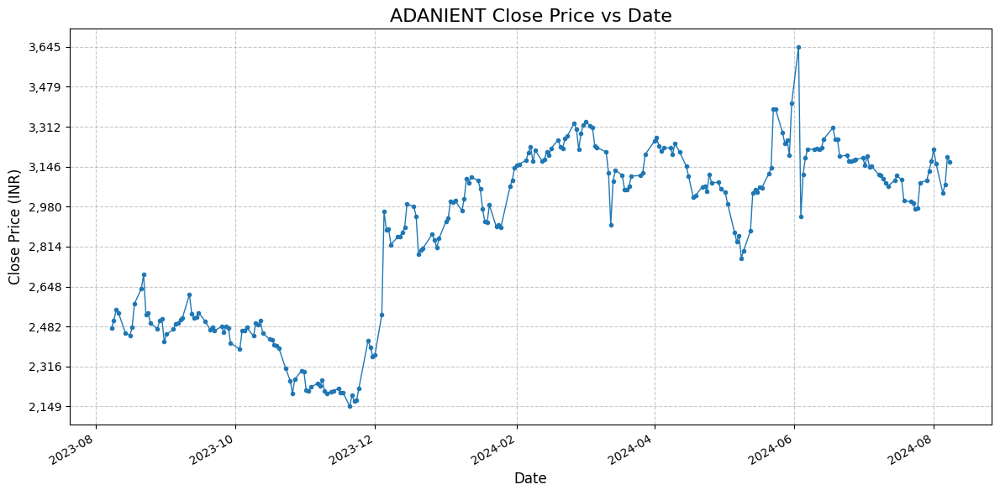

In [33]:
# Read the CSV file
df = pd.read_csv('stock_data_adani.csv')

# Convert the 'Date_x' column to datetime
df['Date_x'] = pd.to_datetime(df['Date_x'], format='%d-%b-%y')

# Convert 'ClosePrice' to numeric, removing any commas
df['ClosePrice'] = df['ClosePrice'].str.replace(',', '').astype(float)

# Sort the dataframe by date
df = df.sort_values('Date_x')

# Remove duplicate dates, keeping the last entry for each date
df = df.drop_duplicates(subset='Date_x', keep='last')

# Create the plot
plt.figure(figsize=(12, 6))
plt.plot(df['Date_x'], df['ClosePrice'], marker='o', markersize=3, linestyle='-', linewidth=1)

# Customize the plot
plt.title('ADANIENT Close Price vs Date', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Close Price (INR)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Format x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=2))
plt.gcf().autofmt_xdate()  # Rotate and align the tick labels

# Format y-axis
y_min = df['ClosePrice'].min()
y_max = df['ClosePrice'].max()
y_range = y_max - y_min
plt.ylim(y_min - 0.05*y_range, y_max + 0.05*y_range)

# Set y-axis ticks
y_ticks = np.linspace(y_min, y_max, 10)
plt.yticks(y_ticks)

# Add commas to y-axis labels
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: format(int(x), ',')))

# Adjust layout to prevent cutting off labels
plt.tight_layout()

# Show the plot
plt.show()


C:\Users\leste\AppData\Local\Temp\ipykernel_61432\2016431059.py:2: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('stock_data_bpcl.csv')


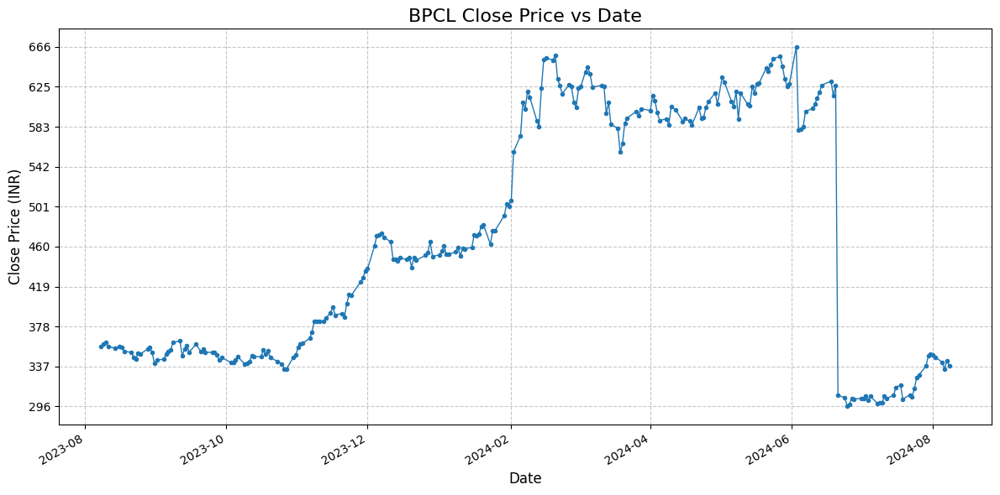

In [34]:
# Read the CSV file
df = pd.read_csv('stock_data_bpcl.csv')

# Convert the 'Date_x' column to datetime
df['Date_x'] = pd.to_datetime(df['Date_x'], format='mixed', dayfirst=True)

# Convert 'ClosePrice' to numeric, removing any commas
# df['ClosePrice'] = df['ClosePrice'].str.replace(',', '').astype(float)
df['ClosePrice'] = df['ClosePrice'].astype(float)

# Sort the dataframe by date
df = df.sort_values('Date_x')

# Remove duplicate dates, keeping the last entry for each date
df = df.drop_duplicates(subset='Date_x', keep='last')

# Create the plot
plt.figure(figsize=(12, 6))
plt.plot(df['Date_x'], df['ClosePrice'], marker='o', markersize=3, linestyle='-', linewidth=1)

# Customize the plot
plt.title('BPCL Close Price vs Date', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Close Price (INR)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Format x-axis
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=2))
plt.gcf().autofmt_xdate()  # Rotate and align the tick labels

# Format y-axis
y_min = df['ClosePrice'].min()
y_max = df['ClosePrice'].max()
y_range = y_max - y_min
plt.ylim(y_min - 0.05*y_range, y_max + 0.05*y_range)

# Set y-axis ticks
y_ticks = np.linspace(y_min, y_max, 10)
plt.yticks(y_ticks)

# Add commas to y-axis labels
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: format(int(x), ',')))

# Adjust layout to prevent cutting off labels
plt.tight_layout()

# Show the plot
plt.show()


C:\Users\leste\AppData\Local\Temp\ipykernel_61432\1095006851.py:2: DtypeWarning: Columns (4,5,6,7,8,9,10,15) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('stock_options_data.csv')
C:\Users\leste\AppData\Local\Temp\ipykernel_61432\1095006851.py:72: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


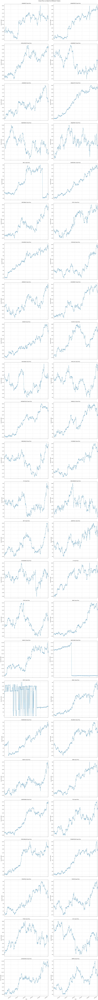

In [35]:
# Read the CSV file
df = pd.read_csv('stock_options_data.csv')

# Convert the 'Date_x' column to datetime
df['Date_x'] = pd.to_datetime(df['Date_x'], format='mixed', dayfirst=True)

# Convert 'ClosePrice' to numeric, removing any commas
df['ClosePrice'] = df['ClosePrice'].astype(str).str.replace(',', '').astype(float)
# df['ClosePrice'] = df['ClosePrice'].astype(float)

# Get unique tickers
tickers = df['Ticker'].unique()

# Calculate the number of rows and columns for subplots
n = len(tickers)
cols = 2  # You can adjust this number based on your preference
rows = (n + cols - 1) // cols

# # Create subplots
# fig, axes = plt.subplots(rows, cols, figsize=(20, 10*rows))
# fig.suptitle('Close Price vs Date for Different Tickers', fontsize=16)

# Create subplots with extra space at the top
fig, axes = plt.subplots(rows, cols, figsize=(20, 10*rows), constrained_layout=True)
fig.suptitle('Close Price vs Date for Different Tickers', fontsize=16, y=1)

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Determine the overall date range
overall_start_date = df['Date_x'].min()
overall_end_date = df['Date_x'].max()

for i, ticker in enumerate(tickers):
    ticker_data = df[df['Ticker'] == ticker].sort_values('Date_x')
    ticker_data = ticker_data.drop_duplicates(subset='Date_x', keep='last')
    
    ax = axes[i]
    ax.plot(ticker_data['Date_x'], ticker_data['ClosePrice'], marker='o', markersize=3, linestyle='-', linewidth=1)
    
    ax.set_title(f'{ticker} Close Price', fontsize=12)
    ax.set_xlabel('Date', fontsize=10)
    ax.set_ylabel('Close Price (INR)', fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.7)
    
    # Set the same x-axis range for all subplots
    ax.set_xlim(overall_start_date, overall_end_date)
    
    # ax.set_xlim(ticker_data['Date_x'].min(), ticker_data['Date_x'].max())
    
    # Format x-axis
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    
    # Format y-axis
    y_min = ticker_data['ClosePrice'].min()
    y_max = ticker_data['ClosePrice'].max()
    y_range = y_max - y_min
    ax.set_ylim(y_min - 0.05*y_range, y_max + 0.05*y_range)
    
    # Set y-axis ticks
    y_ticks = np.linspace(y_min, y_max, 10)
    ax.set_yticks(y_ticks)
    
    # Add commas to y-axis labels
    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: format(int(x), ',')))

# Remove any unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
fig.autofmt_xdate()  # Rotate and align the tick labels
plt.show()


#### Merge the sentiment scores with the financial dataset.

In [36]:
# Renaming the columns to ensure consistency
stock_data.rename(columns={'Ticker': 'ticker'}, inplace=True)
final_news_data.rename(columns={'ticker': 'ticker'}, inplace=True)

# Convert date columns to datetime format
stock_data['Date_x'] = pd.to_datetime(stock_data['Date_x'], format='%d-%m-%Y')
final_news_data['date'] = pd.to_datetime(final_news_data['date'], format='%d-%m-%Y')

# Sort the dataframes
stock_data = stock_data.sort_values('Date_x')
final_news_data = final_news_data.sort_values('date')

# Perform the merge
merged_stock_data = pd.merge_asof(
    stock_data,
    final_news_data,
    left_on='Date_x',
    right_on='date',
    by='ticker',
    direction='backward'
)


In [37]:
merged_stock_data

,Symbol,Series,Date_x,PrevClose,OpenPrice,HighPrice,LowPrice,LastPrice,ClosePrice,AveragePrice,...,Asset Type_y,Option Type_call,Option Type_put,Unnamed: 0,url,title,date,content,Clean_Title,Sentiment
0,ADANIENT,EQ,2023-08-09,"2,474.55","2,488.35","2,516.90","2,472.00","2,506.00","2,507.10","2,500.07",...,Stock,True,False,NaN,NaN,NaN,NaT,NaN,NaN,NaN
1,BHARTIARTL,EQ,2023-08-09,885.40,885.00,897.45,878.80,882.05,883.70,889.34,...,Stock,False,True,NaN,NaN,NaN,NaT,NaN,NaN,NaN
2,BHARTIARTL,EQ,2023-08-09,885.40,885.00,897.45,878.80,882.05,883.70,889.34,...,Stock,True,False,NaN,NaN,NaN,NaT,NaN,NaN,NaN
3,BHARTIARTL,EQ,2023-08-09,885.40,885.00,897.45,878.80,882.05,883.70,889.34,...,Stock,False,True,NaN,NaN,NaN,NaT,NaN,NaN,NaN
4,BHARTIARTL,EQ,2023-08-09,885.40,885.00,897.45,878.80,882.05,883.70,889.34,...,Stock,True,False,NaN,NaN,NaN,NaT,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1886693,SBIN,EQ,2024-08-08,808.65,812.0,817.8,802.8,808.15,808.05,809.92,...,Stock,True,False,1320.0,https://economictimes.indiatimes.com/markets/s...,SBI Q1 net rises 1% as loan loss provisions widen,2024-08-04,Loan loss provisions increased 70% year on yea...,SBI Q1 net rises 1% as loan loss provisions widen,Negative
1886694,SBIN,EQ,2024-08-08,808.65,812.0,817.8,802.8,808.15,808.05,809.92,...,Stock,False,True,1320.0,https://economictimes.indiatimes.com/markets/s...,SBI Q1 net rises 1% as loan loss provisions widen,2024-08-04,Loan loss provisions increased 70% year on yea...,SBI Q1 net rises 1% as loan loss provisions widen,Negative
1886695,SBIN,EQ,2024-08-08,808.65,812.0,817.8,802.8,808.15,808.05,809.92,...,Stock,True,False,1320.0,https://economictimes.indiatimes.com/markets/s...,SBI Q1 net rises 1% as loan loss provisions widen,2024-08-04,Loan loss provisions increased 70% year on yea...,SBI Q1 net rises 1% as loan loss provisions widen,Negative
1886696,SBIN,EQ,2024-08-08,808.65,812.0,817.8,802.8,808.15,808.05,809.92,...,Stock,True,False,1320.0,https://economictimes.indiatimes.com/markets/s...,SBI Q1 net rises 1% as loan loss provisions widen,2024-08-04,Loan loss provisions increased 70% year on yea...,SBI Q1 net rises 1% as loan loss provisions widen,Negative


In [38]:
print(f"Number of None values: {final_news_data['date'].isnull().sum()}")

Number of None values: 0


In [39]:
merged_stock_data

,Symbol,Series,Date_x,PrevClose,OpenPrice,HighPrice,LowPrice,LastPrice,ClosePrice,AveragePrice,...,Asset Type_y,Option Type_call,Option Type_put,Unnamed: 0,url,title,date,content,Clean_Title,Sentiment
0,ADANIENT,EQ,2023-08-09,"2,474.55","2,488.35","2,516.90","2,472.00","2,506.00","2,507.10","2,500.07",...,Stock,True,False,NaN,NaN,NaN,NaT,NaN,NaN,NaN
1,BHARTIARTL,EQ,2023-08-09,885.40,885.00,897.45,878.80,882.05,883.70,889.34,...,Stock,False,True,NaN,NaN,NaN,NaT,NaN,NaN,NaN
2,BHARTIARTL,EQ,2023-08-09,885.40,885.00,897.45,878.80,882.05,883.70,889.34,...,Stock,True,False,NaN,NaN,NaN,NaT,NaN,NaN,NaN
3,BHARTIARTL,EQ,2023-08-09,885.40,885.00,897.45,878.80,882.05,883.70,889.34,...,Stock,False,True,NaN,NaN,NaN,NaT,NaN,NaN,NaN
4,BHARTIARTL,EQ,2023-08-09,885.40,885.00,897.45,878.80,882.05,883.70,889.34,...,Stock,True,False,NaN,NaN,NaN,NaT,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1886693,SBIN,EQ,2024-08-08,808.65,812.0,817.8,802.8,808.15,808.05,809.92,...,Stock,True,False,1320.0,https://economictimes.indiatimes.com/markets/s...,SBI Q1 net rises 1% as loan loss provisions widen,2024-08-04,Loan loss provisions increased 70% year on yea...,SBI Q1 net rises 1% as loan loss provisions widen,Negative
1886694,SBIN,EQ,2024-08-08,808.65,812.0,817.8,802.8,808.15,808.05,809.92,...,Stock,False,True,1320.0,https://economictimes.indiatimes.com/markets/s...,SBI Q1 net rises 1% as loan loss provisions widen,2024-08-04,Loan loss provisions increased 70% year on yea...,SBI Q1 net rises 1% as loan loss provisions widen,Negative
1886695,SBIN,EQ,2024-08-08,808.65,812.0,817.8,802.8,808.15,808.05,809.92,...,Stock,True,False,1320.0,https://economictimes.indiatimes.com/markets/s...,SBI Q1 net rises 1% as loan loss provisions widen,2024-08-04,Loan loss provisions increased 70% year on yea...,SBI Q1 net rises 1% as loan loss provisions widen,Negative
1886696,SBIN,EQ,2024-08-08,808.65,812.0,817.8,802.8,808.15,808.05,809.92,...,Stock,True,False,1320.0,https://economictimes.indiatimes.com/markets/s...,SBI Q1 net rises 1% as loan loss provisions widen,2024-08-04,Loan loss provisions increased 70% year on yea...,SBI Q1 net rises 1% as loan loss provisions widen,Negative


In [40]:
adanient_data = merged_stock_data[merged_stock_data['ticker'] == 'ADANIENT']
adanient_data

,Symbol,Series,Date_x,PrevClose,OpenPrice,HighPrice,LowPrice,LastPrice,ClosePrice,AveragePrice,...,Asset Type_y,Option Type_call,Option Type_put,Unnamed: 0,url,title,date,content,Clean_Title,Sentiment
0,ADANIENT,EQ,2023-08-09,"2,474.55","2,488.35","2,516.90","2,472.00","2,506.00","2,507.10","2,500.07",...,Stock,True,False,NaN,NaN,NaN,NaT,NaN,NaN,NaN
7585,ADANIENT,EQ,2023-08-09,"2,474.55","2,488.35","2,516.90","2,472.00","2,506.00","2,507.10","2,500.07",...,Stock,True,False,NaN,NaN,NaN,NaT,NaN,NaN,NaN
7586,ADANIENT,EQ,2023-08-09,"2,474.55","2,488.35","2,516.90","2,472.00","2,506.00","2,507.10","2,500.07",...,Stock,True,False,NaN,NaN,NaN,NaT,NaN,NaN,NaN
7587,ADANIENT,EQ,2023-08-09,"2,474.55","2,488.35","2,516.90","2,472.00","2,506.00","2,507.10","2,500.07",...,Stock,False,True,NaN,NaN,NaN,NaT,NaN,NaN,NaN
7588,ADANIENT,EQ,2023-08-09,"2,474.55","2,488.35","2,516.90","2,472.00","2,506.00","2,507.10","2,500.07",...,Stock,True,False,NaN,NaN,NaN,NaT,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1880158,ADANIENT,EQ,2024-08-08,"3,185.95","3,190.55","3,242.65","3,156.55","3,172.55","3,167.55","3,194.74",...,Stock,False,True,33.0,https://economictimes.indiatimes.com/markets/s...,"Stocks in news: Titan, Hindustan Zinc, ITC, Sp...",2024-08-02,"Sensex reached a new peak, closing 126 points ...","Stocks in news: Titan, Hindustan Zinc, ITC, Sp...",Positive
1880159,ADANIENT,EQ,2024-08-08,"3,185.95","3,190.55","3,242.65","3,156.55","3,172.55","3,167.55","3,194.74",...,Stock,True,False,33.0,https://economictimes.indiatimes.com/markets/s...,"Stocks in news: Titan, Hindustan Zinc, ITC, Sp...",2024-08-02,"Sensex reached a new peak, closing 126 points ...","Stocks in news: Titan, Hindustan Zinc, ITC, Sp...",Positive
1880160,ADANIENT,EQ,2024-08-08,"3,185.95","3,190.55","3,242.65","3,156.55","3,172.55","3,167.55","3,194.74",...,Stock,False,True,33.0,https://economictimes.indiatimes.com/markets/s...,"Stocks in news: Titan, Hindustan Zinc, ITC, Sp...",2024-08-02,"Sensex reached a new peak, closing 126 points ...","Stocks in news: Titan, Hindustan Zinc, ITC, Sp...",Positive
1880161,ADANIENT,EQ,2024-08-08,"3,185.95","3,190.55","3,242.65","3,156.55","3,172.55","3,167.55","3,194.74",...,Stock,True,False,33.0,https://economictimes.indiatimes.com/markets/s...,"Stocks in news: Titan, Hindustan Zinc, ITC, Sp...",2024-08-02,"Sensex reached a new peak, closing 126 points ...","Stocks in news: Titan, Hindustan Zinc, ITC, Sp...",Positive


In [41]:
print(f"Number of None values: {adanient_data['Sentiment'].isnull().sum()}")

Number of None values: 11682


In [42]:
sentiment_counts = adanient_data['Sentiment'].value_counts()
print("Sentiment counts:")
print(sentiment_counts)

positive_count = sentiment_counts.get('Positive', 0)
negative_count = sentiment_counts.get('Negative', 0)

print(f"Number of Positive sentiment: {positive_count}")
print(f"Number of Negative sentiment: {negative_count}")

Sentiment counts:
Sentiment
Positive    9676
Neutral     7198
Negative     708
Name: count, dtype: int64
Number of Positive sentiment: 9676
Number of Negative sentiment: 708


In [43]:
adanient_data = adanient_data.sort_values('Date_x')

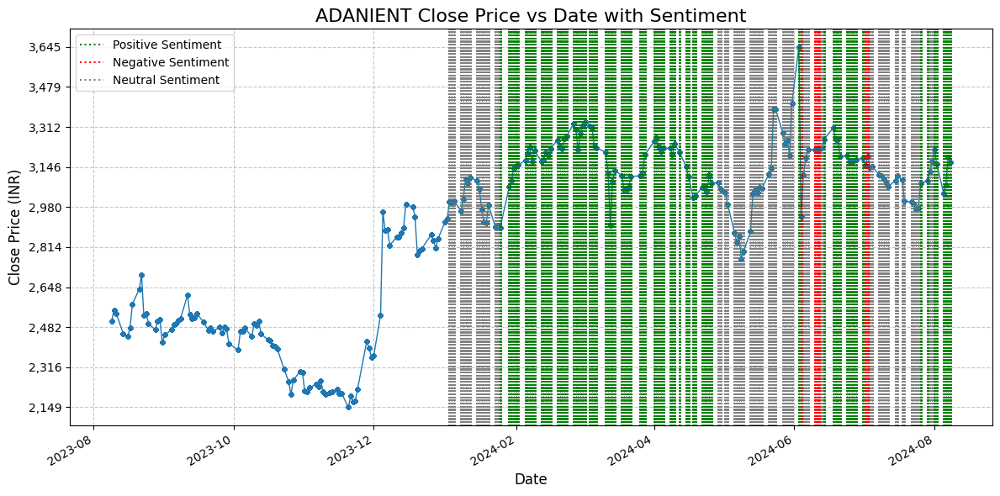

In [44]:
# Assuming adanient_data is already loaded and contains the necessary columns

# Convert 'ClosePrice' to numeric, removing any commas if present
adanient_data['ClosePrice'] = adanient_data['ClosePrice'].replace(',', '', regex=True).astype(float)

# Create the plot
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the stock price
ax.plot(adanient_data['Date_x'], adanient_data['ClosePrice'], marker='o', markersize=3, linestyle='-', linewidth=1)

# Add sentiment lines
for date, sentiment in zip(adanient_data['Date_x'], adanient_data['Sentiment']):
    if sentiment == 'Positive':
        ax.axvline(x=date, color='green', linestyle=':', alpha=0.3, linewidth=1)
    elif sentiment == 'Negative':
        ax.axvline(x=date, color='red', linestyle=':', alpha=0.3, linewidth=1)
    elif sentiment == 'Neutral':
        ax.axvline(x=date, color='gray', linestyle=':', alpha=0.1, linewidth=1)

# Customize the plot
ax.set_title('ADANIENT Close Price vs Date with Sentiment', fontsize=16)
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('Close Price (INR)', fontsize=12)
ax.grid(True, linestyle='--', alpha=0.7)

# Format x-axis
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
fig.autofmt_xdate()  # Rotate and align the tick labels

# Format y-axis
y_min = adanient_data['ClosePrice'].min()
y_max = adanient_data['ClosePrice'].max()
y_range = y_max - y_min
ax.set_ylim(y_min - 0.05*y_range, y_max + 0.05*y_range)

# Set y-axis ticks
y_ticks = np.linspace(y_min, y_max, 10)
ax.set_yticks(y_ticks)

# Add commas to y-axis labels
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: format(int(x), ',')))

# Add legend
ax.plot([], [], color='green', linestyle=':', label='Positive Sentiment')
ax.plot([], [], color='red', linestyle=':', label='Negative Sentiment')
ax.plot([], [], color='gray', linestyle=':', label='Neutral Sentiment')
ax.legend()

# Adjust layout to prevent cutting off labels
plt.tight_layout()

# Show the plot
plt.show()

C:\Users\leste\AppData\Local\Temp\ipykernel_61432\1893216150.py:80: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


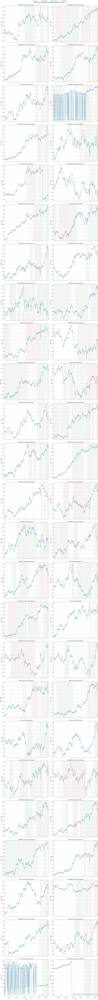

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# Assuming merged_stock_data_1 is already loaded and contains the necessary columns

merged_stock_data['ClosePrice'] = merged_stock_data['ClosePrice'].replace(',', '', regex=True).astype(float)

# Get unique tickers
tickers = merged_stock_data['ticker'].unique()

# Calculate the number of rows and columns for subplots
n = len(tickers)
cols = 2  # You can adjust this number based on your preference
rows = (n + cols - 1) // cols

# Create subplots with extra space at the top
fig, axes = plt.subplots(rows, cols, figsize=(20, 10*rows), constrained_layout=True)
fig.suptitle('Close Price vs Date with Sentiment for Different Tickers', fontsize=16, y=1)

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Determine the overall date range
overall_start_date = merged_stock_data['Date_x'].min()
overall_end_date = merged_stock_data['Date_x'].max()

for i, ticker in enumerate(tickers):
    ticker_data = merged_stock_data[merged_stock_data['ticker'] == ticker].sort_values('Date_x')
    ticker_data = ticker_data.drop_duplicates(subset='Date_x', keep='last')
    
    ax = axes[i]
    
    # Plot stock price
    ax.plot(ticker_data['Date_x'], ticker_data['ClosePrice'], marker='o', markersize=3, linestyle='-', linewidth=1)
    
    # Add sentiment lines
    for date, sentiment in zip(ticker_data['Date_x'], ticker_data['Sentiment']):
        if sentiment == 'Positive':
            ax.axvline(x=date, color='green', linestyle=':', alpha=0.3, linewidth=1)
        elif sentiment == 'Negative':
            ax.axvline(x=date, color='red', linestyle=':', alpha=0.3, linewidth=1)
        elif sentiment == 'Neutral':
            ax.axvline(x=date, color='gray', linestyle=':', alpha=0.1, linewidth=1)
    
    ax.set_title(f'{ticker} Close Price with Sentiment', fontsize=12)
    ax.set_xlabel('Date', fontsize=10)
    ax.set_ylabel('Close Price (INR)', fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.7)
    
    # Set the same x-axis range for all subplots
    ax.set_xlim(overall_start_date, overall_end_date)
    
    # Format x-axis
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    
    # Format y-axis
    y_min = ticker_data['ClosePrice'].min()
    y_max = ticker_data['ClosePrice'].max()
    y_range = y_max - y_min
    ax.set_ylim(y_min - 0.05*y_range, y_max + 0.05*y_range)
    
    # Set y-axis ticks
    y_ticks = np.linspace(y_min, y_max, 10)
    ax.set_yticks(y_ticks)
    
    # Add commas to y-axis labels
    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: format(int(x), ',')))

# Remove any unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Add a common legend for all subplots
fig.legend(['Stock Price', 'Positive Sentiment', 'Negative Sentiment', 'Neutral Sentiment'], 
           loc='lower center', ncol=4, bbox_to_anchor=(0.5, 1))

plt.tight_layout()
fig.autofmt_xdate()  # Rotate and align the tick labels
plt.show()


### Prepare the combined dataset for prediction.

#### A] Feature Engineering

New features to enhance the predictive power of the model
- Lagged Prices: Prices from previous days.
- Moving Averages: Simple moving averages (SMA) over different periods.
- Volatility Indicators: We can use the rolling standard deviation as a measure of volatility.
- Technical Indicators: We'll include indicators like the Relative Strength Index (RSI) and Moving Average Convergence Divergence (MACD).
- Sentiment Aggregation: Rolling average of the sentiment scores.

In [46]:
merged_stock_data_1 = merged_stock_data

In [47]:
merged_stock_data_1

,Symbol,Series,Date_x,PrevClose,OpenPrice,HighPrice,LowPrice,LastPrice,ClosePrice,AveragePrice,...,Asset Type_y,Option Type_call,Option Type_put,Unnamed: 0,url,title,date,content,Clean_Title,Sentiment
0,ADANIENT,EQ,2023-08-09,"2,474.55","2,488.35","2,516.90","2,472.00","2,506.00",2507.10,"2,500.07",...,Stock,True,False,NaN,NaN,NaN,NaT,NaN,NaN,NaN
1,BHARTIARTL,EQ,2023-08-09,885.40,885.00,897.45,878.80,882.05,883.70,889.34,...,Stock,False,True,NaN,NaN,NaN,NaT,NaN,NaN,NaN
2,BHARTIARTL,EQ,2023-08-09,885.40,885.00,897.45,878.80,882.05,883.70,889.34,...,Stock,True,False,NaN,NaN,NaN,NaT,NaN,NaN,NaN
3,BHARTIARTL,EQ,2023-08-09,885.40,885.00,897.45,878.80,882.05,883.70,889.34,...,Stock,False,True,NaN,NaN,NaN,NaT,NaN,NaN,NaN
4,BHARTIARTL,EQ,2023-08-09,885.40,885.00,897.45,878.80,882.05,883.70,889.34,...,Stock,True,False,NaN,NaN,NaN,NaT,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1886693,SBIN,EQ,2024-08-08,808.65,812.0,817.8,802.8,808.15,808.05,809.92,...,Stock,True,False,1320.0,https://economictimes.indiatimes.com/markets/s...,SBI Q1 net rises 1% as loan loss provisions widen,2024-08-04,Loan loss provisions increased 70% year on yea...,SBI Q1 net rises 1% as loan loss provisions widen,Negative
1886694,SBIN,EQ,2024-08-08,808.65,812.0,817.8,802.8,808.15,808.05,809.92,...,Stock,False,True,1320.0,https://economictimes.indiatimes.com/markets/s...,SBI Q1 net rises 1% as loan loss provisions widen,2024-08-04,Loan loss provisions increased 70% year on yea...,SBI Q1 net rises 1% as loan loss provisions widen,Negative
1886695,SBIN,EQ,2024-08-08,808.65,812.0,817.8,802.8,808.15,808.05,809.92,...,Stock,True,False,1320.0,https://economictimes.indiatimes.com/markets/s...,SBI Q1 net rises 1% as loan loss provisions widen,2024-08-04,Loan loss provisions increased 70% year on yea...,SBI Q1 net rises 1% as loan loss provisions widen,Negative
1886696,SBIN,EQ,2024-08-08,808.65,812.0,817.8,802.8,808.15,808.05,809.92,...,Stock,True,False,1320.0,https://economictimes.indiatimes.com/markets/s...,SBI Q1 net rises 1% as loan loss provisions widen,2024-08-04,Loan loss provisions increased 70% year on yea...,SBI Q1 net rises 1% as loan loss provisions widen,Negative


In [48]:
# Example mapping of sentiment strings to numeric values
sentiment_mapping = {
    'Positive': 1,
    'Negative': -1,
    'Neutral': 0
}

# # Convert 'ClosePrice' to numeric, handling any necessary conversions
# merged_stock_data_1['ClosePrice'] = pd.to_numeric(merged_stock_data_1['ClosePrice'])

# # Handle any potential NaN values in the Sentiment column after mapping
# merged_stock_data_1['Sentiment'].fillna(0, inplace=True)

# Map the sentiment strings to numeric values
merged_stock_data_1['Sentiment'] = merged_stock_data_1['Sentiment'].map(sentiment_mapping)

# Lagged Prices
merged_stock_data_1['Lag1_ClosePrice'] = merged_stock_data_1['ClosePrice'].shift(1)
merged_stock_data_1['Lag3_ClosePrice'] = merged_stock_data_1['ClosePrice'].shift(3)

# Simple Moving Averages (SMA)
merged_stock_data_1['SMA_7'] = merged_stock_data_1['ClosePrice'].rolling(window=7).mean()
merged_stock_data_1['SMA_30'] = merged_stock_data_1['ClosePrice'].rolling(window=30).mean()

# Volatility (using rolling standard deviation)
merged_stock_data_1['Volatility'] = merged_stock_data_1['ClosePrice'].rolling(window=30).std()

# Technical Indicators
# Relative Strength Index (RSI)
delta = merged_stock_data_1['ClosePrice'].diff()
gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
rs = gain / loss
merged_stock_data_1['RSI'] = 100 - (100 / (1 + rs))

# Moving Average Convergence Divergence (MACD)
ema12 = merged_stock_data_1['ClosePrice'].ewm(span=12, adjust=False).mean()
ema26 = merged_stock_data_1['ClosePrice'].ewm(span=26, adjust=False).mean()
merged_stock_data_1['MACD'] = ema12 - ema26
merged_stock_data_1['MACD_Signal'] = merged_stock_data_1['MACD'].ewm(span=9, adjust=False).mean()

# Sentiment Aggregation (7-day rolling average)
merged_stock_data_1['Sentiment_Rolling'] = merged_stock_data_1['Sentiment'].rolling(window=7).mean()

In [49]:
merged_stock_data_1

,Symbol,Series,Date_x,PrevClose,OpenPrice,HighPrice,LowPrice,LastPrice,ClosePrice,AveragePrice,...,Sentiment,Lag1_ClosePrice,Lag3_ClosePrice,SMA_7,SMA_30,Volatility,RSI,MACD,MACD_Signal,Sentiment_Rolling
0,ADANIENT,EQ,2023-08-09,"2,474.55","2,488.35","2,516.90","2,472.00","2,506.00",2507.10,"2,500.07",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN
1,BHARTIARTL,EQ,2023-08-09,885.40,885.00,897.45,878.80,882.05,883.70,889.34,...,NaN,2507.10,NaN,NaN,NaN,NaN,NaN,-129.501994,-25.900399,NaN
2,BHARTIARTL,EQ,2023-08-09,885.40,885.00,897.45,878.80,882.05,883.70,889.34,...,NaN,883.70,NaN,NaN,NaN,NaN,NaN,-229.487865,-66.617892,NaN
3,BHARTIARTL,EQ,2023-08-09,885.40,885.00,897.45,878.80,882.05,883.70,889.34,...,NaN,883.70,2507.10,NaN,NaN,NaN,NaN,-305.209126,-114.336139,NaN
4,BHARTIARTL,EQ,2023-08-09,885.40,885.00,897.45,878.80,882.05,883.70,889.34,...,NaN,883.70,883.70,NaN,NaN,NaN,NaN,-361.056734,-163.680258,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1886693,SBIN,EQ,2024-08-08,808.65,812.0,817.8,802.8,808.15,808.05,809.92,...,-1.0,808.05,808.05,808.050000,703.950000,129.675517,NaN,32.450405,30.416763,-1.0
1886694,SBIN,EQ,2024-08-08,808.65,812.0,817.8,802.8,808.15,808.05,809.92,...,-1.0,808.05,808.05,808.050000,703.950000,129.675517,NaN,31.114738,30.556358,-1.0
1886695,SBIN,EQ,2024-08-08,808.65,812.0,817.8,802.8,808.15,808.05,809.92,...,-1.0,808.05,808.05,808.050000,712.625000,127.556988,NaN,29.713691,30.387825,-1.0
1886696,SBIN,EQ,2024-08-08,808.65,812.0,817.8,802.8,808.15,808.05,809.92,...,-1.0,808.05,808.05,808.050000,721.300000,124.780324,NaN,28.277387,29.965737,-1.0


In [ ]:
merged_stock_data_1.to_csv('final_merged_stock_data.csv')

##### B] Label Creation

Creating a binary target variable where 1 indicates a bullish market movement (price increase) and 0 indicates a bearish market movement (price decrease).

In [2]:
merged_stock_data_1 = pd.read_csv('final_merged_stock_data.csv')

C:\Users\leste\AppData\Local\Temp\ipykernel_4596\3458418953.py:1: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  merged_stock_data_1 = pd.read_csv('final_merged_stock_data.csv')


In [5]:
# Define the target label (binary classification)
# Here, we'll consider a price increase the next day as bullish (1) and a decrease or no change as bearish (0)
merged_stock_data_1['Target'] = (merged_stock_data_1['ClosePrice'].shift(-1) > merged_stock_data_1['ClosePrice']).astype(int)

In [6]:
merged_stock_data_1

,Unnamed: 0.1,Symbol,Series,Date_x,PrevClose,OpenPrice,HighPrice,LowPrice,LastPrice,ClosePrice,...,Lag1_ClosePrice,Lag3_ClosePrice,SMA_7,SMA_30,Volatility,RSI,MACD,MACD_Signal,Sentiment_Rolling,Target
0,0,ADANIENT,EQ,2023-08-08,"2,550.50","2,563.25","2,563.25","2,461.30","2,477.05",2474.55,...,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN,1
1,1,TCS,EQ,2023-08-08,"3,484.05","3,484.05","3,489.95","3,456.60","3,469.00",3470.60,...,2474.55,NaN,NaN,NaN,NaN,NaN,79.456980,15.891396,NaN,0
2,2,TCS,EQ,2023-08-08,"3,484.05","3,484.05","3,489.95","3,456.60","3,469.00",3470.60,...,3470.60,NaN,NaN,NaN,NaN,NaN,140.804107,40.873938,NaN,0
3,3,TCS,EQ,2023-08-08,"3,484.05","3,484.05","3,489.95","3,456.60","3,469.00",3470.60,...,3470.60,2474.55,NaN,NaN,NaN,NaN,187.263490,70.151849,NaN,0
4,4,TCS,EQ,2023-08-08,"3,484.05","3,484.05","3,489.95","3,456.60","3,469.00",3470.60,...,3470.60,3470.60,NaN,NaN,NaN,NaN,221.529235,100.427326,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1894931,1894931,TATACONSUM,EQ,2024-08-08,"1,199.60","1,192.00","1,195.00","1,174.00","1,176.05",1178.30,...,1178.30,1178.30,1178.300000,1187.416667,49.934040,50.0,-10.332120,-10.672306,-1.0,0
1894932,1894932,TATACONSUM,EQ,2024-08-08,"1,199.60","1,192.00","1,195.00","1,174.00","1,176.05",1178.30,...,1178.30,1178.30,1178.300000,1187.416667,49.934040,50.0,-10.106105,-10.559066,-1.0,0
1894933,1894933,TATACONSUM,EQ,2024-08-08,"1,199.60","1,192.00","1,195.00","1,174.00","1,176.05",1178.30,...,1178.30,1178.30,1178.300000,1187.416667,49.934040,50.0,-9.813859,-10.410025,-1.0,0
1894934,1894934,TATACONSUM,EQ,2024-08-08,"1,199.60","1,192.00","1,195.00","1,174.00","1,176.05",1178.30,...,1178.30,1178.30,1178.300000,1187.416667,49.934040,0.0,-9.473052,-10.222630,-1.0,0


##### C] Data Normalization and Splitting

Normalization or standardization ensures that each feature contributes equally to the model training process, especially for machine learning algorithms sensitive to feature scaling.

In [7]:
from sklearn.preprocessing import StandardScaler

# Selecting the features and target
features = ['Date_x', 'Lag1_ClosePrice', 'Lag3_ClosePrice', 'SMA_7', 'SMA_30', 'Volatility', 'RSI', 'MACD', 'MACD_Signal', 'Sentiment_Rolling']

# Drop rows with NaN values in any of the relevant columns for both features and target
merged_stock_data_1.dropna(subset=features + ['Target'], inplace=True)

# Extract the features and target
X = merged_stock_data_1[features].dropna()
y = merged_stock_data_1['Target'].dropna()

# # Normalizing the features
# scaler = StandardScaler()
# X_normalized = scaler.fit_transform(X)

# Converting back to DataFrame for better readability
# X_normalized = pd.DataFrame(X_normalized, columns=features)

In [35]:
X_1 = merged_stock_data_1[features].dropna()
y_1 = merged_stock_data_1['Target'].dropna()
final_dataset = pd.concat([X_1, y_1], axis=1)
final_dataset
final_dataset.to_csv("my_dataset_for_llama.csv")

In [36]:
final_dataset

,Lag1_ClosePrice,Lag3_ClosePrice,SMA_7,SMA_30,Volatility,RSI,MACD,MACD_Signal,Sentiment_Rolling,Target
260,4605.35,4605.35,4605.350000,3503.180000,931.371156,59.81847,437.645691,265.851205,1.0,0
261,4605.35,4605.35,4605.350000,3541.005000,952.798238,59.81847,457.114014,304.103767,1.0,0
262,4605.35,4605.35,4605.350000,3578.830000,972.232793,59.81847,467.157697,336.714553,1.0,0
263,4605.35,4605.35,4605.350000,3616.655000,989.792196,59.81847,469.702945,363.312231,1.0,0
264,4605.35,4605.35,4605.350000,3654.480000,1005.574685,59.81847,466.344345,383.918654,1.0,0
...,...,...,...,...,...,...,...,...,...,...
1894931,1178.30,1178.30,1178.300000,1187.416667,49.934040,50.00000,-10.332120,-10.672306,-1.0,0
1894932,1178.30,1178.30,1178.300000,1187.416667,49.934040,50.00000,-10.106105,-10.559066,-1.0,0
1894933,1178.30,1178.30,1178.300000,1187.416667,49.934040,50.00000,-9.813859,-10.410025,-1.0,0
1894934,1178.30,1178.30,1178.300000,1187.416667,49.934040,0.00000,-9.473052,-10.222630,-1.0,0


In [37]:
target_counts = final_dataset['Target'].value_counts()
print(target_counts)

Target
0    438050
1     21001
Name: count, dtype: int64


In [8]:
X

,Date_x,Lag1_ClosePrice,Lag3_ClosePrice,SMA_7,SMA_30,Volatility,RSI,MACD,MACD_Signal,Sentiment_Rolling
260,2023-08-08,4605.35,4605.35,4605.350000,3503.180000,931.371156,59.81847,437.645691,265.851205,1.0
261,2023-08-08,4605.35,4605.35,4605.350000,3541.005000,952.798238,59.81847,457.114014,304.103767,1.0
262,2023-08-08,4605.35,4605.35,4605.350000,3578.830000,972.232793,59.81847,467.157697,336.714553,1.0
263,2023-08-08,4605.35,4605.35,4605.350000,3616.655000,989.792196,59.81847,469.702945,363.312231,1.0
264,2023-08-08,4605.35,4605.35,4605.350000,3654.480000,1005.574685,59.81847,466.344345,383.918654,1.0
...,...,...,...,...,...,...,...,...,...,...
1894931,2024-08-08,1178.30,1178.30,1178.300000,1187.416667,49.934040,50.00000,-10.332120,-10.672306,-1.0
1894932,2024-08-08,1178.30,1178.30,1178.300000,1187.416667,49.934040,50.00000,-10.106105,-10.559066,-1.0
1894933,2024-08-08,1178.30,1178.30,1178.300000,1187.416667,49.934040,50.00000,-9.813859,-10.410025,-1.0
1894934,2024-08-08,1178.30,1178.30,1178.300000,1187.416667,49.934040,0.00000,-9.473052,-10.222630,-1.0


In [9]:
y

260        0
261        0
262        0
263        0
264        0
          ..
1894931    0
1894932    0
1894933    0
1894934    0
1894935    0
Name: Target, Length: 459051, dtype: int32

In [10]:
from sklearn.model_selection import train_test_split

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [11]:
X_train

,Date_x,Lag1_ClosePrice,Lag3_ClosePrice,SMA_7,SMA_30,Volatility,RSI,MACD,MACD_Signal,Sentiment_Rolling
1305590,2024-04-10,1266.30,1266.30,1266.300000,1166.930000,76.901792,100.000000,37.808633,30.497725,-1.000000
1373546,2024-04-25,4634.70,30.26,1426.448571,1440.249667,1001.321012,72.317213,372.977513,75.448230,0.857143
1166200,2024-03-13,2906.20,2906.20,2906.200000,1746.400000,963.161475,100.000000,507.203164,465.766267,1.000000
1271909,2024-04-04,9146.15,9146.15,9146.150000,3825.050000,4418.933028,100.000000,2323.862723,2132.277656,1.000000
1628018,2024-06-14,1717.20,1717.20,1717.200000,2643.930000,769.607375,0.000000,-413.994357,-384.971634,0.000000
...,...,...,...,...,...,...,...,...,...,...
1467507,2024-05-14,5043.45,5043.45,5043.450000,2182.866667,1630.837880,83.845064,981.909234,598.870156,1.000000
1704359,2024-07-02,694.75,694.75,694.750000,724.250000,161.578154,50.000000,-58.137904,-68.647272,-1.000000
1037206,2024-02-19,1530.10,1530.10,1530.100000,991.548333,714.785614,56.812948,243.620256,240.081983,0.000000
1100738,2024-02-29,1320.50,1320.50,1320.500000,1349.530000,159.003858,50.000000,53.627330,83.907347,1.000000


In [12]:
X_test

,Date_x,Lag1_ClosePrice,Lag3_ClosePrice,SMA_7,SMA_30,Volatility,RSI,MACD,MACD_Signal,Sentiment_Rolling
1742195,2024-07-09,5377.15,5377.15,5377.150000,6140.760000,590.952777,0.000000,-327.275760,-287.187411,0.000000
1162074,2024-03-12,1204.25,1204.25,1240.721429,1979.406667,1224.547940,35.356704,-498.772385,-507.867391,0.142857
1453058,2024-05-10,2771.25,2771.25,2535.371429,2716.211667,301.457367,0.000000,-131.692774,-26.309464,0.857143
1564009,2024-06-03,284.10,284.10,284.100000,764.725000,488.841407,0.000000,-182.071943,-113.991114,1.000000
225366,2023-09-18,1798.35,3431.75,2731.721429,3235.233333,519.815775,0.000000,-267.007180,-60.471970,0.571429
...,...,...,...,...,...,...,...,...,...,...
1513381,2024-05-23,1165.25,1165.25,1165.250000,561.098333,383.839881,72.345548,104.211471,-6.438850,0.000000
202646,2023-09-13,3320.30,3320.30,3320.300000,5409.216667,2485.689036,28.402594,-804.920088,-700.951163,1.000000
1796238,2024-07-22,3001.35,3001.35,3220.414286,3052.465000,279.968385,100.000000,113.319336,11.274249,0.142857
1484515,2024-05-17,1141.35,907.45,1007.692857,1071.180000,109.018825,50.000000,4.039939,-4.519174,0.000000


#### Prediction Using LLMs via API

##### A] Data Formatting for API Input

In [ ]:
#checking the structure of the prompt to be passed 
row = row = {
    'Lag1_ClosePrice': 2450.25,
    'Lag3_ClosePrice': 2445.75,
    'SMA_7': 2460.85,
    'SMA_30': 2475.30,
    'Volatility': 1.52,
    'RSI': 55.78,
    'MACD': 2.30,
    'MACD_Signal': 1.85,
    'Sentiment_Rolling': 0.75
}
print(f"Given the following market data:" \
           f" - Lag1_ClosePrice: {row['Lag1_ClosePrice']}," \
           f" - Lag3_ClosePrice: {row['Lag3_ClosePrice']}," \
           f" - 7-day SMA: {row['SMA_7']}," \
           f" - 30-day SMA: {row['SMA_30']}," \
           f" - Volatility: {row['Volatility']}," \
           f" - RSI: {row['RSI']}," \
           f" - MACD: {row['MACD']}," \
           f" - MACD Signal: {row['MACD_Signal']}," \
           f" - Sentiment Rolling: {row['Sentiment_Rolling']}." \
           f"Return strictly a single word as prediction value which is 'bullish' if the market is absolutely 'bullish' or 'bearish' if the market is absolutely 'bearish'.")

In [17]:
# Function to create a text prompt for the LLM
def create_prompt(row):
    return f"Given the following market data:" \
           f" - Lag1_ClosePrice: {row['Lag1_ClosePrice']}," \
           f" - Lag3_ClosePrice: {row['Lag3_ClosePrice']}," \
           f" - 7-day SMA: {row['SMA_7']}," \
           f" - 30-day SMA: {row['SMA_30']}," \
           f" - Volatility: {row['Volatility']}," \
           f" - RSI: {row['RSI']}," \
           f" - MACD: {row['MACD']}," \
           f" - MACD Signal: {row['MACD_Signal']}," \
           f" - Sentiment Rolling: {row['Sentiment_Rolling']}." \
           f"Return strictly a single word as prediction value which is 'bullish' if the market is absolutely 'bullish' or 'bearish' if the market is absolutely 'bearish'."


In [18]:
X_test['Prompt'] = X_test.apply(create_prompt, axis=1)
X_test

,Date_x,Lag1_ClosePrice,Lag3_ClosePrice,SMA_7,SMA_30,Volatility,RSI,MACD,MACD_Signal,Sentiment_Rolling,Prompt
1742195,2024-07-09,5377.15,5377.15,5377.150000,6140.760000,590.952777,0.000000,-327.275760,-287.187411,0.000000,Given the following market data: - Lag1_CloseP...
1162074,2024-03-12,1204.25,1204.25,1240.721429,1979.406667,1224.547940,35.356704,-498.772385,-507.867391,0.142857,Given the following market data: - Lag1_CloseP...
1453058,2024-05-10,2771.25,2771.25,2535.371429,2716.211667,301.457367,0.000000,-131.692774,-26.309464,0.857143,Given the following market data: - Lag1_CloseP...
1564009,2024-06-03,284.10,284.10,284.100000,764.725000,488.841407,0.000000,-182.071943,-113.991114,1.000000,Given the following market data: - Lag1_CloseP...
225366,2023-09-18,1798.35,3431.75,2731.721429,3235.233333,519.815775,0.000000,-267.007180,-60.471970,0.571429,Given the following market data: - Lag1_CloseP...
...,...,...,...,...,...,...,...,...,...,...,...
1513381,2024-05-23,1165.25,1165.25,1165.250000,561.098333,383.839881,72.345548,104.211471,-6.438850,0.000000,Given the following market data: - Lag1_CloseP...
202646,2023-09-13,3320.30,3320.30,3320.300000,5409.216667,2485.689036,28.402594,-804.920088,-700.951163,1.000000,Given the following market data: - Lag1_CloseP...
1796238,2024-07-22,3001.35,3001.35,3220.414286,3052.465000,279.968385,100.000000,113.319336,11.274249,0.142857,Given the following market data: - Lag1_CloseP...
1484515,2024-05-17,1141.35,907.45,1007.692857,1071.180000,109.018825,50.000000,4.039939,-4.519174,0.000000,Given the following market data: - Lag1_CloseP...


In [86]:
len(X_test.iloc[0]['Prompt'])

434

In [39]:
X_test.iloc[0]['Prompt']

"Given the following market data: - Lag1_ClosePrice: 5377.15, - Lag3_ClosePrice: 5377.15, - 7-day SMA: 5377.15, - 30-day SMA: 6140.759999999998, - Volatility: 590.952776778849, - RSI: 0.0, - MACD: -327.2757601859312, - MACD Signal: -287.1874106737844, - Sentiment Rolling: 0.0.Return strictly a single word as prediction value which is 'bullish' if the market is absolutely 'bullish' or 'bearish' if the market is absolutely 'bearish'."

In [17]:
y_test.iloc[0]

0

#### Experiment checking with GPT 4.o

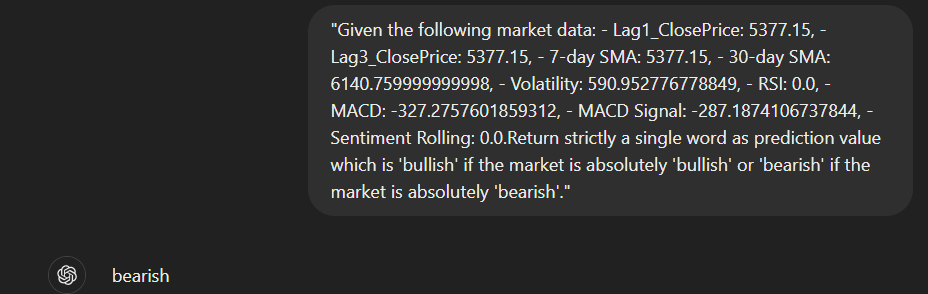

#### Experiment checking with Lama 3

>>> "Given the following market data: - Lag1_ClosePrice: 5377.15, - Lag3_ClosePrice: 5377.15, - 7-day SMA: 5377.15, - 30
... -day SMA: 6140.759999999998, - Volatility: 590.952776778849, - RSI: 0.0, - MACD: -327.2757601859312, - MACD Signal:
... -287.1874106737844, - Sentiment Rolling: 0.0.Return strictly a single word as prediction value which is 'bullish' if
...  the market is absolutely 'bullish' or 'bearish' if the market is absolutely 'bearish'."
Based on the provided data:

* Lag prices are identical to each other and the current price, indicating stagnation.
* The 7-day SMA matches the current close, reinforcing the idea of a stable, but not necessarily trending, market.
* The 30-day SMA is significantly higher, suggesting that the market has been trending upward for some time.
* Volatility is relatively high (590.95), indicating that the market can be unpredictable and prone to sudden
changes.
* RSI is at 0.0, which is a strong sign of an oversold condition.
* MACD and Signal lines are both strongly negative, suggesting a sell signal.
* Sentiment Rolling is at 0.0, which is a strong indication of bearish sentiment.

Considering these factors, I would predict: **BEARISH**

In [25]:
# Randomly sample 10,000 rows from X_test
sampled_X_test = X_test.sample(n=10000, random_state=42)

# Optionally, get the corresponding y_test values
sampled_y_test = y_test.loc[sampled_X_test.index]

In [25]:
import time
import threading
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm.auto import tqdm
from collections import defaultdict
from tqdm.auto import tqdm

In [26]:
rate_limit_lock = threading.Lock()
RATE_LIMIT_INTERVAL = 60  # 60 seconds interval
MAX_REQUESTS_PER_INTERVAL = 500  # Max 500 requests per minute
MAX_TOKENS_PER_INTERVAL = 200000  # Max 30,000 tokens per minute
# MAX_TOKENS_PER_DAY = 90000  # Max 90,000 tokens per day

request_count = 0
token_count = 0
daily_token_count = 0
start_time = time.time()
day_start_time = time.time()
def rate_limiter(token_usage):
   global request_count, token_count, daily_token_count, start_time, day_start_time
   with rate_limit_lock:
      current_time = time.time()
      elapsed_time = current_time - start_time
      day_elapsed_time = current_time - day_start_time

      # Reset interval counts if interval has passed
      if elapsed_time > RATE_LIMIT_INTERVAL:
         start_time = current_time
         request_count = 0
         token_count = 0

      # Reset daily count if a day has passed
      if day_elapsed_time > 86400:  # 86400 seconds in a day
         day_start_time = current_time
         daily_token_count = 0

      # Check if we need to wait due to request or token limits
      if request_count >= MAX_REQUESTS_PER_INTERVAL or token_count + token_usage > MAX_TOKENS_PER_INTERVAL: #or daily_token_count + token_usage > MAX_TOKENS_PER_DAY
         sleep_time = RATE_LIMIT_INTERVAL - elapsed_time
         print(f"Rate limit reached. Sleeping for {sleep_time:.2f} seconds.")
         time.sleep(max(sleep_time, 0))
         # Reset counts after sleep
         start_time = time.time()
         request_count = 0
         token_count = 0

      # Update counts
      request_count += 1
      token_count += token_usage
      daily_token_count += token_usage

In [23]:
os.environ['OPENAI_API_KEY'] = "Enter your Open API Key"

client = OpenAI(api_key=os.environ.get("OPENAI_API_KEY"))
def query_gpt(prompt):
   # Estimate token usage, for example, by counting words or characters in the prompt
#    token_usage = len(prompt.split())  # This is a rough estimate; adjust based on actual usage

   # Apply rate limiting before making the API call
   rate_limiter(500)

   response = client.chat.completions.create(
      model="gpt-3.5-turbo",
      messages=[{"role": "user", "content": prompt}],
      max_tokens=100,
   )
   print("c1", response.choices[0].message.content)
   return response.choices[0].message.content


# Function to process prompts using multithreading
def process_prompts(df, prompt_col, num_workers=10):
    responses = []

    # Initialize tqdm progress bar
    with tqdm(total=len(df), desc="Processing Prompts") as pbar:
        with ThreadPoolExecutor(max_workers=num_workers) as executor:
            futures = {executor.submit(query_gpt, row[prompt_col]): index for index, row in df.iterrows()}
            
            for future in as_completed(futures):
                try:
                    result = future.result()
                    responses.append(result)
                except Exception as e:
                    responses.append(None)
                    print(f"Error: {e}")
                
                # Update progress bar
                pbar.update(1)
    
    return responses

In [26]:
# Apply the function to get predictions
sampled_X_test['Prediction'] = process_prompts(sampled_X_test, 'Prompt')

Processing Prompts:   0%|          | 0/10000 [00:00<?, ?it/s]

c1 bullish
c1 bullish
c1 Bullish
c1 Bearish
c1 Bullish
c1 bearish
c1 bearish
c1 bullish
c1 bearish
c1 bullish
c1 Bearish
c1 Bullish
c1 Bullish
c1 bearish
c1 Bearish
c1 bearish
c1 Bullish
c1 bullish
c1 bullish
c1 Bullish
c1 Bearish
c1 Bearish
c1 Bullish
c1 Bullish
c1 bullish
c1 bearish
c1 bearish
c1 Bullish
c1 bearish
c1 bullish
c1 bullish
c1 Neutral
c1 bearish
c1 Bullish
c1 Bearish
c1 bullish
c1 bullish
c1 Bearish
c1 Bullish
c1 Bearish
c1 Bullish
c1 Bearish
c1 bearish
c1 bearish
c1 bullish
c1 bearish
c1 Bearish
c1 bullish
c1 bullish
c1 bullish
c1 bullish
Rate limit reached. Sleeping for 56.89 seconds.
c1 bullish
c1 Bearish
c1 Bullish
c1 Bearish
c1 bullish
c1 bearish
c1 Bullish
c1 bearish
c1 Bearish
c1 bullish
c1 bullish
c1 Bullish
c1 Bearish
c1 bullish
c1 bullish
c1 bearish
c1 bullish
c1 bullish
c1 bullish
c1 bullish
c1 bullish
c1 bullish
c1 bearish
c1 Bearish
c1 Bearish
c1 Bullish
c1 Bullish
c1 Bullish
c1 Bearish
c1 bullish
c1 bullish
c1 Bullish
c1 bullish
c1 Bearish
c1 Bearish
c1 bul

In [59]:
y_backup = sampled_y_test.copy()

In [60]:
sampled_y_test.drop(drop_index, inplace=True)

In [63]:
sampled_y_test.to_csv("Final_labeled_yTest.csv")

In [ ]:
sampled_y_test['Prediction'] = sampled_y_test['Prediction'].apply(lambda x: "".join(x) if isinstance(x, list) else x)

In [44]:
data_backup = sampled_X_test.copy()

In [58]:
drop_index=data_backup[data_backup['Prediction'].isna()].index

In [46]:
sampled_X_test.drop(sampled_X_test[sampled_X_test['Prediction'].isna()].index, inplace=True)

In [64]:
sampled_X_test.to_csv("Final_labeled_XTest.csv")

In [69]:
sampled_y_test.iloc[0]

0

In [16]:
sampled_X_test.iloc[0]['Prediction']

'bullish'

In [43]:
# Check all unique values in the 'Prediction' column
unique_values = sampled_X_test['Prediction'].unique()

# Print the unique values
print(unique_values)


['bullish' 'Bullish' 'Bearish' 'bearish' 'Neutral' 'Bullish.' 'Bearish.'
 'neutral' 'bearish.' 'Uncertain' "'bullish'"
 'Nopredictionscanbemadebasedonthegivenmarketdata.' 'Undecided' 'bullish.'
 'Wild' 'Mixed' nan 'beaish']


In [44]:
import numpy as np

# Define the mapping
mapping = {
    'bullish': 1, 'Bullish': 1, 'bullish.': 1, "'bullish'": 1,
    'bearish': 0, 'Bearish': 0, 'bearish.': 0, 'beaish': 0,
    'Bullish.': 1, 'Bearish.': 0, 
    'Neutral': np.nan, 'neutral': np.nan,
    'Uncertain': np.nan, 'Undecided': np.nan, 'Wild': np.nan,
    'Mixed': np.nan, 'N/A': np.nan, 
    'Nopredictionscanbemadebasedonthegivenmarketdata.': np.nan
}

# Apply the mapping to the 'Prediction' column
sampled_X_test['predicted_sentiment'] = sampled_X_test['Prediction'].map(mapping)

In [50]:
sampled_X_test['predicted_sentiment'].unique

<bound method Series.unique of 0       1
1       1
2       1
3       0
4       1
       ..
9363    1
9364    1
9365    1
9366    0
9367    0
Name: predicted_sentiment, Length: 9245, dtype: int64>

In [51]:
sampled_y_test

,Unnamed: 0,Target
0,1453838,0
1,1696327,0
2,1212069,0
3,1666066,0
4,1787327,0
...,...,...
9363,1476210,0
9364,1580499,0
9365,1668895,0
9366,1839307,0


In [48]:
# Convert the 'predicted_sentiment' column to int64
sampled_X_test['predicted_sentiment'] = sampled_X_test['predicted_sentiment'].astype('int64')

C:\Users\leste\AppData\Local\Temp\ipykernel_15832\2170673195.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sampled_X_test['predicted_sentiment'] = sampled_X_test['predicted_sentiment'].astype('int64')


In [52]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Drop rows with NaN in the 'predicted_sentiment' column
filtered_X_test = sampled_X_test.dropna(subset=['predicted_sentiment'])

# Ensure the true labels correspond to the filtered predictions
filtered_y_test = sampled_y_test.loc[filtered_X_test.index]

# Evaluate the performance
accuracy = accuracy_score(filtered_y_test['Target'], filtered_X_test['predicted_sentiment'])
precision = precision_score(filtered_y_test['Target'], filtered_X_test['predicted_sentiment'], pos_label=1)
recall = recall_score(filtered_y_test['Target'], filtered_X_test['predicted_sentiment'], pos_label=1)
f1 = f1_score(filtered_y_test['Target'], filtered_X_test['predicted_sentiment'], pos_label=1)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

Accuracy: 0.4647
Precision: 0.0398
Recall: 0.4700
F1 Score: 0.0734


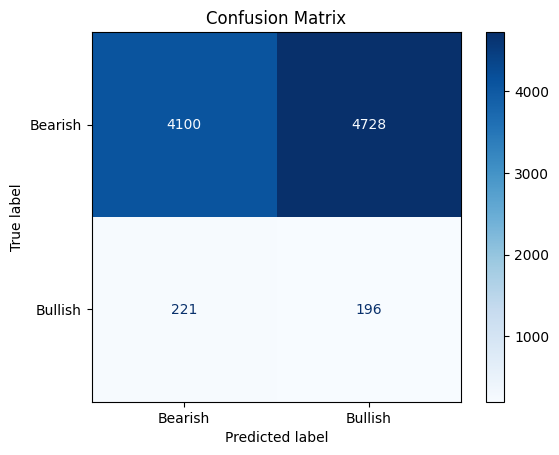

In [77]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute the confusion matrix
cm = confusion_matrix(filtered_y_test, filtered_X_test['predicted_sentiment'])

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Bearish', 'Bullish'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()

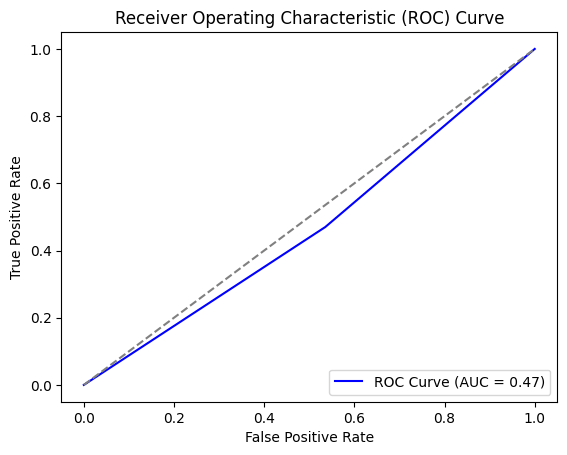

In [79]:
from sklearn.metrics import roc_curve, roc_auc_score

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(filtered_y_test, filtered_X_test['predicted_sentiment'])

# Calculate AUC
auc_score = roc_auc_score(filtered_y_test, filtered_X_test['predicted_sentiment'])

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='blue', label=f'ROC Curve (AUC = {auc_score:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


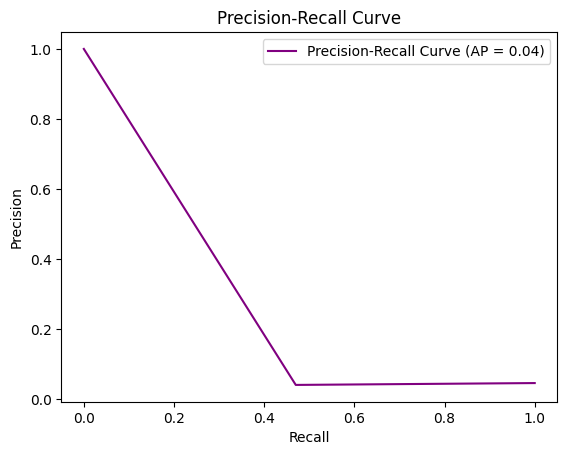

In [62]:
from sklearn.metrics import precision_recall_curve, average_precision_score

# Calculate precision-recall curve
precision, recall, thresholds = precision_recall_curve(filtered_y_test['Target'], filtered_X_test['predicted_sentiment'])

# Calculate average precision score
avg_precision = average_precision_score(filtered_y_test['Target'], filtered_X_test['predicted_sentiment'])

# Plot precision-recall curve
plt.figure()
plt.plot(recall, precision, color='purple', label=f'Precision-Recall Curve (AP = {avg_precision:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc="upper right")
plt.show()

In [80]:
from sklearn.metrics import classification_report

# Generate the classification report
report = classification_report(filtered_y_test, filtered_X_test['predicted_sentiment'], target_names=['Bearish', 'Bullish'])
print(report)

              precision    recall  f1-score   support

     Bearish       0.95      0.46      0.62      8828
     Bullish       0.04      0.47      0.07       417

    accuracy                           0.46      9245
   macro avg       0.49      0.47      0.35      9245
weighted avg       0.91      0.46      0.60      9245



### Experiment with Chat GPT - 4 

In [19]:
# Randomly sample 10,000 rows from X_test
sampled_X_test_1 = X_test.sample(n=5000, random_state=42)

In [20]:
sampled_X_test_1

,Date_x,Lag1_ClosePrice,Lag3_ClosePrice,SMA_7,SMA_30,Volatility,RSI,MACD,MACD_Signal,Sentiment_Rolling,Prompt
1453838,2024-05-10,2377.15,2377.15,2437.164286,2713.230000,170.912687,0.000000,-356.162642,-418.139865,0.857143,Given the following market data: - Lag1_CloseP...
1696327,2024-06-28,2670.45,2670.45,2670.450000,4287.606667,1880.903473,50.000000,-472.345313,-375.208905,1.000000,Given the following market data: - Lag1_CloseP...
1212069,2024-03-21,5159.90,5159.90,5159.900000,2223.400000,1955.254261,100.000000,716.057607,194.586053,1.000000,Given the following market data: - Lag1_CloseP...
1666066,2024-06-24,7081.85,7081.85,7081.850000,3762.481667,2633.083962,100.000000,1144.368510,856.511820,1.000000,Given the following market data: - Lag1_CloseP...
1787327,2024-07-18,377.75,377.75,377.750000,464.975000,461.244998,50.472390,-71.574929,-53.912046,1.000000,Given the following market data: - Lag1_CloseP...
...,...,...,...,...,...,...,...,...,...,...,...
1323420,2024-04-15,2053.45,2053.45,1436.092857,1020.460000,1246.961492,100.000000,252.798587,90.427591,0.000000,Given the following market data: - Lag1_CloseP...
1165942,2024-03-13,1502.65,422.45,825.071429,1088.895000,695.398990,100.000000,-77.549305,-225.284852,0.857143,Given the following market data: - Lag1_CloseP...
1271188,2024-04-03,1542.65,1542.65,1542.650000,2731.068333,1328.746520,27.050682,-383.264446,-312.071683,-1.000000,Given the following market data: - Lag1_CloseP...
1783199,2024-07-18,9626.20,1493.90,3685.885714,2005.363333,2078.365180,90.768722,1106.424258,306.311426,0.000000,Given the following market data: - Lag1_CloseP...


In [21]:
# Optionally, get the corresponding y_test values
sampled_y_test_1 = y_test.loc[sampled_X_test_1.index]

In [22]:
sampled_y_test_1

1453838    0
1696327    0
1212069    0
1666066    0
1787327    0
          ..
1323420    0
1165942    0
1271188    0
1783199    0
1273470    0
Name: Target, Length: 5000, dtype: int32

In [27]:
os.environ['OPENAI_API_KEY'] = "Enter your Open API Key here"

client = OpenAI(api_key=os.environ.get("OPENAI_API_KEY"))
def query_gpt(prompt):
   # Estimate token usage, for example, by counting words or characters in the prompt
#    token_usage = len(prompt.split())  # This is a rough estimate; adjust based on actual usage

   # Apply rate limiting before making the API call
   rate_limiter(500)

   response = client.chat.completions.create(
      model="gpt-4o-mini",
      messages=[{"role": "user", "content": prompt}],
      max_tokens=100,
   )
   print("c1", response.choices[0].message.content)
   return response.choices[0].message.content


# Function to process prompts using multithreading
def process_prompts(df, prompt_col, num_workers=10):
    responses = []

    # Initialize tqdm progress bar
    with tqdm(total=len(df), desc="Processing Prompts") as pbar:
        with ThreadPoolExecutor(max_workers=num_workers) as executor:
            futures = {executor.submit(query_gpt, row[prompt_col]): index for index, row in df.iterrows()}
            
            for future in as_completed(futures):
                try:
                    result = future.result()
                    responses.append(result)
                except Exception as e:
                    responses.append(None)
                    print(f"Error: {e}")
                
                # Update progress bar
                pbar.update(1)
    
    return responses

In [28]:
# Apply the function to get predictions
sampled_X_test_1['Prediction'] = process_prompts(sampled_X_test_1, 'Prompt')

Processing Prompts:   0%|          | 0/5000 [00:00<?, ?it/s]

c1 bullish
c1 bullish
c1 bearish
c1 bullish
c1 bearish
c1 bearish
c1 bearish
c1 bullish
c1 bearish
c1 bullish
c1 bullish
c1 bullish
c1 bearish
c1 bullish
c1 bearish
c1 bearish
c1 bearish
c1 bearish
c1 bullish
c1 bearish
c1 bearish
c1 bearish
c1 bullish
c1 bullish
c1 bullish
c1 bearish
c1 bearish
c1 bullish
c1 bullish
c1 bearish
c1 bullish
c1 bullish
c1 bullish
c1 bearish
c1 bullish
c1 bearish
c1 bullish
c1 bearish
c1 bearish
c1 bullish
c1 bullish
c1 bearish
c1 bearish
c1 bearish
c1 bullish
c1 bearish
c1 bearish
c1 bearish
c1 bearish
c1 bearish
c1 bullish
c1 bearish
c1 bearish
c1 bullish
c1 bullish
c1 bearish
c1 bullish
c1 bearish
c1 bearish
c1 bullish
c1 bullish
c1 bullish
c1 bullish
c1 bearish
c1 bullish
c1c1 bullish
 bullish
c1 bullish
c1 bullish
c1 bearish
c1 bearish
c1 bearish
c1 bullish
c1 bullish
c1 bullish
c1c1 bearish
 bullish
c1 bearish
c1 bullish
c1 bearish
c1 bearish
c1 bullish
c1 bullish
c1 bearish
c1 bearish
c1 bearish
c1 bearish
c1 bullish
c1 bearish
c1 bearish
c1 bearish

In [29]:
# Check all unique values in the 'Prediction' column
unique_values = sampled_X_test_1['Prediction'].unique()

# Print the unique values
print(unique_values)

['bullish' 'bearish' 'neutral']


In [33]:
# Define the mapping
mapping = {
    'bullish': 1, 
    'bearish': 0
}

# Apply the mapping to the 'Prediction' column
sampled_X_test_1['predicted_sentiment'] = sampled_X_test_1['Prediction'].map(mapping)

In [97]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Drop rows with NaN in the 'predicted_sentiment' column
filtered_X_test_1 = sampled_X_test_1.dropna(subset=['predicted_sentiment'])

# Ensure the true labels correspond to the filtered predictions
filtered_y_test_1 = sampled_y_test_1.loc[filtered_X_test_1.index]

# Evaluate the performance
accuracy = accuracy_score(filtered_y_test_1, filtered_X_test_1['predicted_sentiment'])
precision = precision_score(filtered_y_test_1, filtered_X_test_1['predicted_sentiment'], pos_label=1)
recall = recall_score(filtered_y_test_1, filtered_X_test_1['predicted_sentiment'], pos_label=1)
f1 = f1_score(filtered_y_test_1, filtered_X_test_1['predicted_sentiment'], pos_label=1)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

Accuracy: 0.5399
Precision: 0.0377
Recall: 0.3972
F1 Score: 0.0688


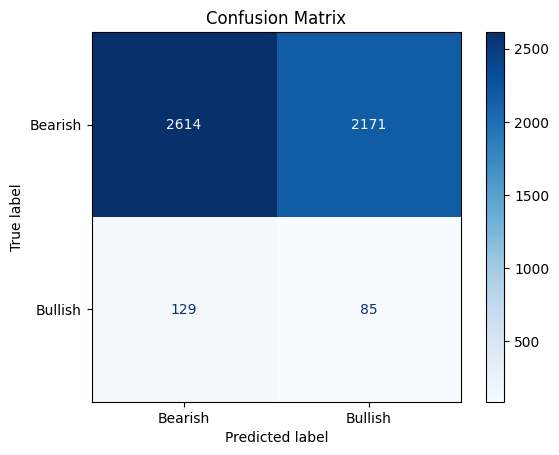

In [35]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute the confusion matrix
cm = confusion_matrix(filtered_y_test_1, filtered_X_test_1['predicted_sentiment'])

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Bearish', 'Bullish'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()

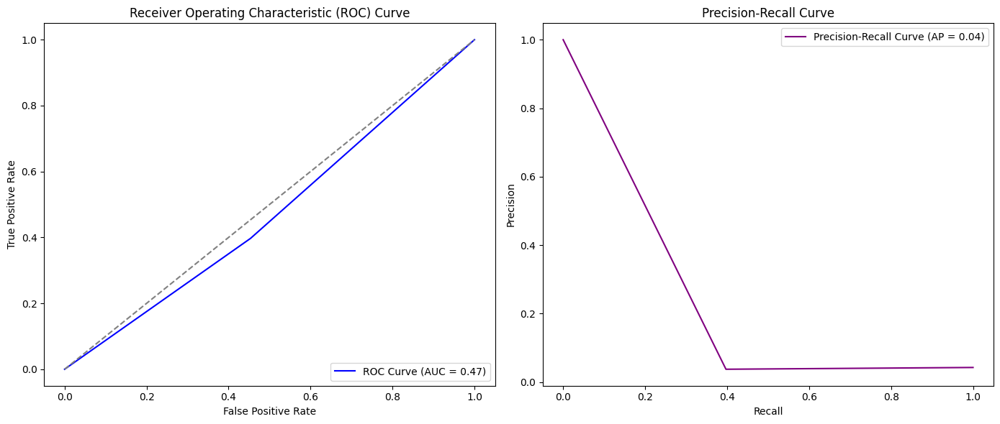

In [36]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score, precision_recall_curve, average_precision_score

# Assuming filtered_y_test and filtered_X_test are pre-defined and available

# Calculate the ROC curve
fpr, tpr, _ = roc_curve(filtered_y_test_1, filtered_X_test_1['predicted_sentiment'])

# Calculate AUC
auc_score = roc_auc_score(filtered_y_test_1, filtered_X_test_1['predicted_sentiment'])

# Calculate precision-recall curve
precision, recall, _ = precision_recall_curve(filtered_y_test_1, filtered_X_test_1['predicted_sentiment'])

# Calculate average precision score
avg_precision = average_precision_score(filtered_y_test_1, filtered_X_test_1['predicted_sentiment'])

# Plot ROC curve and Precision-Recall curve side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Plot ROC curve
ax1.plot(fpr, tpr, color='blue', label=f'ROC Curve (AUC = {auc_score:.2f})')
ax1.plot([0, 1], [0, 1], color='grey', linestyle='--')
ax1.set_xlabel('False Positive Rate')
ax1.set_ylabel('True Positive Rate')
ax1.set_title('Receiver Operating Characteristic (ROC) Curve')
ax1.legend(loc="lower right")

# Plot Precision-Recall curve
ax2.plot(recall, precision, color='purple', label=f'Precision-Recall Curve (AP = {avg_precision:.2f})')
ax2.set_xlabel('Recall')
ax2.set_ylabel('Precision')
ax2.set_title('Precision-Recall Curve')
ax2.legend(loc="upper right")

plt.tight_layout()
plt.show()


In [37]:
from sklearn.metrics import classification_report

# Generate the classification report
report = classification_report(filtered_y_test_1, filtered_X_test_1['predicted_sentiment'], target_names=['Bearish', 'Bullish'])
print(report)

              precision    recall  f1-score   support

     Bearish       0.95      0.55      0.69      4785
     Bullish       0.04      0.40      0.07       214

    accuracy                           0.54      4999
   macro avg       0.50      0.47      0.38      4999
weighted avg       0.91      0.54      0.67      4999



In [103]:
import pandas as pd

# Assuming test_df is your DataFrame

# Calculate the counts for actual (Target) sentiments
actual_bullish_count = (filtered_y_test_1 == 1).sum()
actual_bearish_count = (filtered_y_test_1 == 0).sum()

# Determine the overall sentiment based on actual values
if actual_bullish_count > actual_bearish_count:
    actual_overall_sentiment = 'bullish'
elif actual_bearish_count > actual_bullish_count:
    actual_overall_sentiment = 'bearish'
else:
    actual_overall_sentiment = 'neutral'  # If there's a tie

# Calculate the counts for predicted (Llama 3.1 Predictions) sentiments
predicted_bullish_count = (filtered_X_test_1['predicted_sentiment'] == 1).sum()
predicted_bearish_count = (filtered_X_test_1['predicted_sentiment'] == 0).sum()

# Determine the overall sentiment based on predicted values
if predicted_bullish_count > predicted_bearish_count:
    predicted_overall_sentiment = 'bullish'
elif predicted_bearish_count > predicted_bullish_count:
    predicted_overall_sentiment = 'bearish'
else:
    predicted_overall_sentiment = 'neutral'  # If there's a tie

# Print the results for actual values
print("ChatGPT 4.o model")
print("Overall Sentiment for NIFTY 50 Based on Actual Values:")
print(f"Overall Sentiment: {actual_overall_sentiment}")
print(f"Bullish Count: {actual_bullish_count}")
print(f"Bearish Count: {actual_bearish_count}")

# Print the results for predicted values
print("\nOverall Sentiment for NIFTY 50 Based on Predicted Values:")
print(f"Overall Sentiment: {predicted_overall_sentiment}")
print(f"Bullish Count: {predicted_bullish_count}")
print(f"Bearish Count: {predicted_bearish_count}")


ChatGPT 4.o model
Overall Sentiment for NIFTY 50 Based on Actual Values:
Overall Sentiment: bearish
Bullish Count: 214
Bearish Count: 4785

Overall Sentiment for NIFTY 50 Based on Predicted Values:
Overall Sentiment: bearish
Bullish Count: 2256
Bearish Count: 2743


In [53]:
final_filtered_X_test = filtered_X_test_1

# Define the mapping
mapping = {
    1: 'bullish', 
    0: 'bearish'
}

# Apply the mapping to the 'Prediction' column
final_filtered_X_test['predicted_sentiment'] = final_filtered_X_test['predicted_sentiment'].map(mapping)

df = final_filtered_X_test  # Assuming test_df contains your test results
# Calculate daily sentiment
daily_sentiment = df.groupby('Date_x')['predicted_sentiment'].apply(lambda x: (x == 'bullish').sum() - (x == 'bearish').sum())

# Determine overall daily sentiment
daily_sentiment_overall = daily_sentiment.apply(lambda x: 'bullish' if x > 0 else 'bearish')

In [62]:
daily_sentiment_overall

Date_x
2023-08-08    bearish
2023-08-09    bearish
2023-08-10    bearish
2023-08-11    bearish
2023-08-14    bearish
               ...   
2024-08-02    bullish
2024-08-05    bearish
2024-08-06    bearish
2024-08-07    bearish
2024-08-08    bullish
Name: predicted_sentiment, Length: 249, dtype: object

In [61]:
import yfinance as yf
import pandas as pd

# Download NIFTY 50 historical data
nifty_df = yf.download("^NSEI", start="2023-08-01", end="2024-07-31")  # Replace with actual dates

# Reset index to get 'date' column
nifty_df.reset_index(inplace=True)

# Check the structure
print(nifty_df.head())

[*********************100%%**********************]  1 of 1 completed

        Date          Open          High           Low         Close  \
0 2023-08-01  19784.000000  19795.599609  19704.599609  19733.550781   
1 2023-08-02  19655.400391  19678.250000  19423.550781  19526.550781   
2 2023-08-03  19463.750000  19537.650391  19296.449219  19381.650391   
3 2023-08-04  19462.800781  19538.849609  19436.449219  19517.000000   
4 2023-08-07  19576.849609  19620.449219  19524.800781  19597.300781   

      Adj Close  Volume  
0  19733.550781  298000  
1  19526.550781  290700  
2  19381.650391  315700  
3  19517.000000  280800  
4  19597.300781  216600  


In [74]:
# Rename the columns to be consistent
nifty_df.rename(columns={'Date': 'date'}, inplace=True)

# Convert the Series to a DataFrame
daily_sentiment_overall_df = daily_sentiment_overall.to_frame()

# Rename the columns of the DataFrame
daily_sentiment_overall_df.rename(columns={'Date_x': 'date'}, inplace=True)

In [91]:
# Reset the index to make 'Date_x' a column
daily_sentiment_overall_df.reset_index(inplace=True)

# Rename 'Date_x' to 'date'
daily_sentiment_overall_df.rename(columns={'Date_x': 'date'}, inplace=True)


In [87]:
import pandas as pd

# Ensure 'date' is the index for both DataFrames if not already
nifty_df.set_index('date', inplace=True)
daily_sentiment_overall_df.set_index('date', inplace=True)

# Reindex daily_sentiment_overall_df to match the index of nifty_df
aligned_sentiment = daily_sentiment_overall_df.reindex(nifty_df.index)

# Assign the reindexed sentiment to nifty_df
nifty_df['Predicted_Sentiment'] = aligned_sentiment['predicted_sentiment']

# Reset index if necessary (optional)
nifty_df.reset_index(inplace=True)

# Check the DataFrame
print(nifty_df.head())

        date          Open          High           Low         Close  \
0 2023-08-01  19784.000000  19795.599609  19704.599609  19733.550781   
1 2023-08-02  19655.400391  19678.250000  19423.550781  19526.550781   
2 2023-08-03  19463.750000  19537.650391  19296.449219  19381.650391   
3 2023-08-04  19462.800781  19538.849609  19436.449219  19517.000000   
4 2023-08-07  19576.849609  19620.449219  19524.800781  19597.300781   

      Adj Close  Volume Predicted_Sentiment  
0  19733.550781  298000                 NaN  
1  19526.550781  290700                 NaN  
2  19381.650391  315700                 NaN  
3  19517.000000  280800                 NaN  
4  19597.300781  216600                 NaN  


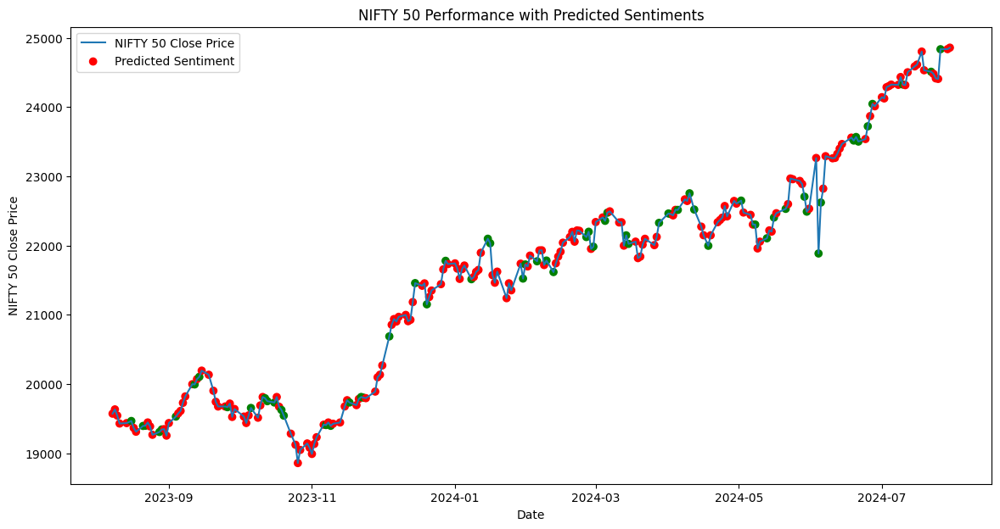

In [93]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a DataFrame 'nifty_df' with columns 'date' and 'nifty_close'
# nifty_df['Predicted_Sentiment'] = daily_sentiment_overall

# Convert 'date' column in nifty_df to datetime
nifty_df['date'] = pd.to_datetime(nifty_df['date'])

# Convert 'date' column in daily_sentiment_overall_df to datetime
daily_sentiment_overall_df['date'] = pd.to_datetime(daily_sentiment_overall_df['date'])

# Sort the DataFrames by date (required for merge_asof)
nifty_df.sort_values('date', inplace=True)
daily_sentiment_overall_df.sort_values('date', inplace=True)

# Merge with actual NIFTY 50 data
merged_df = pd.merge_asof(
    nifty_df,
    daily_sentiment_overall_df,
    on='date',
    direction='backward',
    tolerance=pd.Timedelta('2D')
)

# Remove rows where 'Predicted_Sentiment' is NaN
filtered_df = merged_df.dropna(subset=['Predicted_Sentiment'])

# Now plot
plt.figure(figsize=(14, 7))
plt.plot(filtered_df['date'], filtered_df['Close'], label='NIFTY 50 Close Price')
plt.scatter(filtered_df['date'], filtered_df['Close'], 
            c=filtered_df['Predicted_Sentiment'].map({'bullish': 'green', 'bearish': 'red'}), 
            label='Predicted Sentiment')
plt.xlabel('Date')
plt.ylabel('NIFTY 50 Close Price')
plt.title('NIFTY 50 Performance with Predicted Sentiments')
plt.legend()
plt.show()


In [94]:
filtered_df

,date,Open,High,Low,Close,Adj Close,Volume,Predicted_Sentiment,predicted_sentiment
5,2023-08-08,19627.199219,19634.400391,19533.099609,19570.849609,19570.849609,260300,bearish,bearish
6,2023-08-09,19578.800781,19645.500000,19467.500000,19632.550781,19632.550781,266500,bearish,bearish
7,2023-08-10,19605.550781,19623.599609,19495.400391,19543.099609,19543.099609,312200,bearish,bearish
8,2023-08-11,19554.250000,19557.750000,19412.750000,19428.300781,19428.300781,235500,bearish,bearish
9,2023-08-14,19383.949219,19465.849609,19257.900391,19434.550781,19434.550781,243900,bearish,bearish
...,...,...,...,...,...,...,...,...,...
238,2024-07-24,24444.949219,24504.250000,24307.250000,24413.500000,24413.500000,366600,bearish,bearish
239,2024-07-25,24230.949219,24426.150391,24210.800781,24406.099609,24406.099609,391800,bearish,bearish
240,2024-07-26,24423.349609,24861.150391,24410.900391,24834.849609,24834.849609,383800,bullish,bullish
241,2024-07-29,24943.300781,24999.750000,24774.599609,24836.099609,24836.099609,355000,bearish,bearish


#### Experiment with Llama 2 

In [31]:
X_train['Prompt'] = X_train.apply(create_prompt, axis=1)
X_train

,Lag1_ClosePrice,Lag3_ClosePrice,SMA_7,SMA_30,Volatility,RSI,MACD,MACD_Signal,Sentiment_Rolling,Prompt
1305590,1266.30,1266.30,1266.300000,1166.930000,76.901792,100.000000,37.808633,30.497725,-1.000000,Given the following market data: - Lag1_CloseP...
1373546,4634.70,30.26,1426.448571,1440.249667,1001.321012,72.317213,372.977513,75.448230,0.857143,Given the following market data: - Lag1_CloseP...
1166200,2906.20,2906.20,2906.200000,1746.400000,963.161475,100.000000,507.203164,465.766267,1.000000,Given the following market data: - Lag1_CloseP...
1271909,9146.15,9146.15,9146.150000,3825.050000,4418.933028,100.000000,2323.862723,2132.277656,1.000000,Given the following market data: - Lag1_CloseP...
1628018,1717.20,1717.20,1717.200000,2643.930000,769.607375,0.000000,-413.994357,-384.971634,0.000000,Given the following market data: - Lag1_CloseP...
...,...,...,...,...,...,...,...,...,...,...
1467507,5043.45,5043.45,5043.450000,2182.866667,1630.837880,83.845064,981.909234,598.870156,1.000000,Given the following market data: - Lag1_CloseP...
1704359,694.75,694.75,694.750000,724.250000,161.578154,50.000000,-58.137904,-68.647272,-1.000000,Given the following market data: - Lag1_CloseP...
1037206,1530.10,1530.10,1530.100000,991.548333,714.785614,56.812948,243.620256,240.081983,0.000000,Given the following market data: - Lag1_CloseP...
1100738,1320.50,1320.50,1320.500000,1349.530000,159.003858,50.000000,53.627330,83.907347,1.000000,Given the following market data: - Lag1_CloseP...


In [92]:
# Function to create a text prompt for the LLM
def create_prompt(row):
    return f"Lag1_ClosePrice: {row['Lag1_ClosePrice']}," \
           f" Lag3_ClosePrice: {row['Lag3_ClosePrice']}," \
           f" 7-day SMA: {row['SMA_7']}," \
           f" 30-day SMA: {row['SMA_30']}," \
           f" Volatility: {row['Volatility']}," \
           f" RSI: {row['RSI']}," \
           f" MACD: {row['MACD']}," \
           f" MACD Signal: {row['MACD_Signal']}," \
           f" Sentiment Rolling: {row['Sentiment_Rolling']}." 

X_test_2 = X_test           
X_test_2['Prompt'] = X_test_2.apply(create_prompt, axis=1)

Test_Xydata = pd.merge(X_test_2['Prompt'], y_test, left_index=True, right_index=True)
# Define the mapping
mapping = {
    1: 'bullish', 
    0: 'bearish'
}

# Apply the mapping to the 'Prediction' column
Test_Xydata['Target'] = Test_Xydata['Target'].map(mapping)

In [95]:
Test_Xydata

,Prompt,Target
1742195,"Lag1_ClosePrice: 5377.15, Lag3_ClosePrice: 537...",bearish
1162074,"Lag1_ClosePrice: 1204.25, Lag3_ClosePrice: 120...",bearish
1453058,"Lag1_ClosePrice: 2771.25, Lag3_ClosePrice: 277...",bearish
1564009,"Lag1_ClosePrice: 284.1, Lag3_ClosePrice: 284.1...",bearish
225366,"Lag1_ClosePrice: 1798.35, Lag3_ClosePrice: 343...",bearish
...,...,...
1513381,"Lag1_ClosePrice: 1165.25, Lag3_ClosePrice: 116...",bearish
202646,"Lag1_ClosePrice: 3320.3, Lag3_ClosePrice: 3320...",bearish
1796238,"Lag1_ClosePrice: 3001.35, Lag3_ClosePrice: 300...",bearish
1484515,"Lag1_ClosePrice: 1141.35, Lag3_ClosePrice: 907...",bearish
